# 1. Load and convert labeled data into sequential datasets

path/to/labeled_data/ 

    ├── class_0/
    │   ├── sample1.pkl
    │   ├── sample2.csv
    │   └── ...
    ├── class_1/
    │   ├── sample1.csv
    │   ├── sample2.pkl
    │   └── ...
    └── ...

dict_label={'class_0':0, 'class_1':1, ... }

In [20]:
import numpy as np
import os
import pandas as pd
from torch.utils.data import Dataset
import torch
from torchinfo import summary 
import random
from torch.utils.data import random_split, DataLoader, Subset, ConcatDataset


class LoadSeqDataset(Dataset):
    def __init__(self, file_path: str, label: int, selected_features:list, seq_num=28, gap=5, desire_class = None):
        """
        Initialize the dataset from a labeled data file by converting it to sequential format.
        
        Args:
            file_path (str): Path to the labeled data file.
            label (int): Label associated with the sequences from this file.
            seq_num (int): Length of each sequence.
            gap (int): Step size between sequences.
        """
        self.seq_num = seq_num
        self.gap = gap
        self.selected_features = selected_features
        # Define dtype for selected features and label
        dtypes = {col: 'float32' for col in selected_features}
        dtypes['label'] = 'int8'  # Set label as an integer type
        dtypes['time'] = 'float32'  # Set label as an integer type
        # Load data and process into sequences

        self.data = pd.read_csv(file_path, usecols=selected_features + ['label', 'time'], dtype = dtypes)
        self.data.drop(columns='index', inplace=True, errors='ignore')
        self.data.label = self.data.label * label.item()
        self.df = self.data
        #self.sequences = self._make_sequences_contact_only()
        self.sequences = self._make_sequences()
        if desire_class is not None:
            self.sequences = self._get_specific_class(desire_class)
    def balanceData(self, split_rate_1 = 1, split_rate_0=0.15):
        """Balances the dataset by downsampling sequences where label = 0 to 10%."""
        # Separate sequences based on the label
        label_0_sequences = [seq for seq in self.sequences if seq[1] == 0]
        other_label_sequences = [seq for seq in self.sequences if seq[1] != 0]

        # Downsample label 0 sequences to 10%
        num_to_keep = int(len(label_0_sequences) * split_rate_0)
        downsampled_label_0 = random.sample(label_0_sequences, num_to_keep)

        num_to_keep = int(len(other_label_sequences) * split_rate_1)
        other_label_sequences = random.sample(other_label_sequences, num_to_keep)

        # Combine and shuffle
        balanced_sequences = downsampled_label_0 + other_label_sequences
        random.shuffle(balanced_sequences)

        # Update sequences
        self.sequences = balanced_sequences

    def _make_sequences_contact_only(self):
        """Generate sequences based on the contact points detected in the data."""
        start_contact_indexs = self.df.loc[self.df.label.diff() > 0.1, :].index
        end_contact_indexs = self.df.loc[self.df.label.diff() < -0.1, :].index - 1
        contact_indexs = [idx for idx, idx2 in zip(start_contact_indexs, end_contact_indexs) if idx2 - idx >= self.seq_num]

        sequences = []
        for contact_index in contact_indexs:
            end_point = contact_index + self.seq_num
            for step in range(contact_index, end_point, self.gap):
                window = self.df[self.selected_features][step - self.seq_num + 1:step + 1]
                sequences.append((window.values, self.df.label[step]))
        return sequences
    
    def _make_sequences(self):
        """Generate sequences over time"""
        sequences = []
        for step in range(self.seq_num,self.data.shape[0], self.gap):
            window = self.df[self.selected_features][step - self.seq_num:step]
            sequences.append((window.values, self.df.label[step-1]))
        
        return sequences

    def _get_specific_class(self, desired_label):
        filtered_data = [(seq, label) for seq, label in self.sequences if label == desired_label]
        return filtered_data


    def __len__(self):
        """Return the total number of sequences in the dataset."""
        return len(self.sequences)

    def __getitem__(self, idx):
        """
        Retrieve a single sequence and label.
        
        Args:
            idx (int): Index of the sequence to retrieve.
            
        Returns:
            (tuple): (features, target) where target is the label for classification.
        """
        #TODO: multiple features should be reshaped.
        features, target = self.sequences[idx]
        features = features.T if isinstance(features, torch.Tensor) else torch.tensor(features, dtype=torch.float32).T.clone().detach()
        target = target if isinstance(target, torch.Tensor) else torch.tensor(target, dtype=torch.long).clone().detach()
        return features, target


class LoadDatasets(Dataset):
    def __init__(self, data_path:str, dict_label = None):
        """
        Load sequential dataset from a directory structure with labeled subdirectories.

            Expected directory structure:
            
            path/to/data/
                ├── class_0/
                │   ├── sample1.pkl 
                │   ├── sample2.csv
                │   └── ...
                ├── class_1/
                │   ├── sample1.csv
                │   ├── sample2.pkl
                │   └── ...
                └── ...

            Label mapping example:
            
            dict_label = {'class_0': 0, 'class_1': 1, ... }
        
        Args:
            data_path (str): Path to the data directory.
            dict_label (dict, optional): Dictionary mapping class folder names to labels.
        """
        if dict_label is None:
            dict_label = {'a': 7, 'b': 6, 'c': 5, 'd': 4, 'e': 3, 'f': 2, 'g': 1}
            #dict_label = {'link7': 7, 'link6':6, 'link5':5, 'link4':4, 'link3':3, 'link2':2, 'link1':1}

        
        self.samples = []
        self.class_to_idx = {}

        # Scan data_path for subdirectories        
        for class_name in sorted(os.listdir(data_path)):
            class_dir = os.path.join(data_path, class_name)
            if os.path.isdir(class_dir) and class_name in dict_label:
                label = dict_label[class_name]  # Look up label
                self.class_to_idx[class_name] = label
                for file_name in os.listdir(class_dir):
                    file_path = os.path.join(class_dir, file_name)
                    if os.path.isfile(file_path):
                        self.samples.append((file_path, label))
                        
    def __len__(self):
        """Return the total number of samples."""
        return len(self.samples)

    def __getitem__(self, idx):
        """
        Retrieve a single sample at the specified index.
        
        Args:
            idx (int): Index of the sample to retrieve.
            
        Returns:
            tuple: (file_path, label)
        """
        seq_path, label = self.samples[idx]
        return seq_path, label

# 2. load AI models

In [19]:
import argparse
import os
import time
import torch
import numpy as np
import random
import torch.optim as optim
import torch.nn as nn
from torchmetrics import ConfusionMatrix, Accuracy
import matplotlib.pyplot as plt
import torch.nn.functional as F
from torch.nn.utils.rnn import pack_padded_sequence, pad_packed_sequence

   
class ZScoreNormalization(nn.Module):
    def __init__(self):
        super(ZScoreNormalization, self).__init__()

    def forward(self, x, seq_pose=2):
        # Normalize each slice along index=2 independently
        mean = torch.mean(x, dim=seq_pose, keepdim=True)  # Mean across the sequence dimension
        std = torch.std(x, dim=seq_pose, keepdim=True)   # Std across the sequence dimension
        
        # Apply z-score normalization per time sequence
        normalized_x = (x - mean) / (std + 1e-6)  # Avoid division by zero with epsilon
        
        return normalized_x

class cnnLSTM(nn.Module):
    def __init__(self, num_features_joints=28, hidden_size=32, num_layers=3, dropout=0.5, bidirectional=False):
        super(cnnLSTM, self).__init__()
        self.normalization = nn.LayerNorm(num_features_joints)#ZScoreNormalization() #nn.LayerNorm(num_features_joints)#
        
         # Define the 1D CNN layers
        self.cnn1 = nn.Conv1d(in_channels=num_features_joints, out_channels=256, kernel_size=1, padding='same',padding_mode='circular')
        self.cnn2 = nn.Conv1d(in_channels=256, out_channels=512, kernel_size=2, padding='same',padding_mode='circular')
        self.cnn3 = nn.Conv1d(in_channels=512, out_channels=256, kernel_size=4, padding='same',padding_mode='circular')
        
        self.bn1 = nn.BatchNorm1d(256)
        self.bn2 = nn.BatchNorm1d(512)
        self.bn3 = nn.BatchNorm1d(256)
        self.relu = nn.LeakyReLU() #nn.ReLU()
        self.pool = nn.MaxPool1d(kernel_size=2)
        
        # Define the LSTM layer
        self.lstm = nn.LSTM(
            input_size=256//2,
            hidden_size=hidden_size,
            num_layers=num_layers,
            batch_first=True,
            bidirectional=bidirectional,
            dropout=dropout if num_layers > 1 else 0  # Dropout only if num_layers > 1
        )

        lstm_output_size = hidden_size * 2 if bidirectional else hidden_size
        self.normalization_lstm = nn.LayerNorm(lstm_output_size)
        
        # Fully connected layer
        self.fc = nn.Linear(lstm_output_size, 1)

    
        # Dropout for regularization
        self.dropout = nn.Dropout(dropout)
        
        self.lstm_out_calculation = nn.AdaptiveAvgPool1d(1)

    def forward(self, input):
        # Normalize input (batch_size, sequence_length, input_size)
        self.lstm.flatten_parameters()

        normalized_input = self.normalization(input)

        # Reshape for CNN: (batch_size, in_channels, sequence_length)
        cnn_input = normalized_input.permute(0, 2, 1)
        
        # Apply CNN layers
        cnn_out = self.relu(self.bn1(self.cnn1(cnn_input)))#, seq_pose = 1))

        #cnn_out = self.pool(cnn_out.permute(0,2,1)).permute(0,2,1)

        cnn_out = self.relu(self.bn2(self.cnn2(cnn_out)))#, seq_pose = 1))
        #cnn_out = self.pool(cnn_out.permute(0,2,1)).permute(0,2,1)

        cnn_out = self.relu(self.bn3(self.cnn3(cnn_out)))#, seq_pose = 1))
        cnn_out = cnn_out.permute(0,2,1)
        cnn_out = self.pool(cnn_out)

        # Reshape for LSTM: (batch_size, sequence_l98pength, input_size)

        lstm_out, _ = self.lstm(cnn_out)
        lstm_out = self.normalization_lstm(lstm_out)
        # Apply dropout
        lstm_out = self.dropout(lstm_out)
        lstm_out = self.lstm_out_calculation(lstm_out.permute(0, 2, 1)).squeeze(-1)
        # Fully connected layer
        
        joint_step_outputs = self.fc(lstm_out)  # (batch_size, 1, 1)

        # Squeeze to remove the last dimension
        joint_step_outputs = joint_step_outputs.squeeze(-1)  # Shape: (batch_size, 1)
        return joint_step_outputs
    
    def prediction(self, input):
        device = input.device
        output = self.forward(input)
        return (output > 0.5).int()
        #return torch.argmax(output, dim=1)

# 3. Training

In [18]:
# functions
import copy
import plotly.express as px
import chart_studio.plotly as py
import plotly.graph_objs as go
from plotly.offline import iplot, init_notebook_mode
# Using plotly + cufflinks in offline mode
import cufflinks
cufflinks.go_offline(connected=True)
init_notebook_mode(connected=True)
from collections import Counter

def create_hierarchical_labels(contact_indices, num_links):
    """
    Generate hierarchical labels for a batch of contact indices.
    
    Args:
        contact_indices (Tensor): A tensor of shape [batch_size] with the contact index for each example in the batch.
        num_links (int): The number of links (length of the output vector).
    
    Returns:
        Tensor: A tensor of shape [batch_size, num_links] containing hierarchical labels for each example.
    """
    batch_size = contact_indices.size(0)  # Get batch size
    y_true = torch.zeros(batch_size, dtype=torch.float32, device=contact_indices.device)  # Initialize a tensor of zeros
    
    for i in range(batch_size):
        contact_index = contact_indices[i]
        if contact_index == 0:
            y_true[i] = 0
        else:
            y_true[i] = 1 
    return y_true
'''
    contact_indices[(contact_indices >0)]=1
    return contact_indices #y_true'''
# Function to calculate detection delay
def contact_detection_accuracy(df, allowable_delay = 30):
    "df should include label, majority voting and time"
    TP, TN, FP, FN = 0, 0, 0, 0
    
    df['label_diff'] = df['label'].diff().fillna(0)
    df['TP'], df['TN'], df['FP'], df['FN'] = None, None, None, None

    contact_delays = []
    no_contact_delays = []
    df = df.reset_index(drop=True)

    change_events = df[df['label_diff'] != 0].index.tolist()

    # Add first and last index if not present
    if 0 not in change_events:
        change_events.insert(0, 0)
    if len(df) - 1 not in change_events:
        change_events.append(len(df) - 1)

    for event_idx in range(len(change_events) - 1):
        idx = change_events[event_idx]
        
        if df.label[idx] == 1: # Starting a contact event
            for i in range(idx, min(idx + allowable_delay, len(df))):
                if df.majority_voting[i] == 1:
                    delay = df.time[i] - df.time[idx]
                    contact_delays.append(delay)
                    break
            
            if i >= (idx + allowable_delay - 1):
                contact_delays.append(0)

            # Calculate TP and FN
            for j in range(change_events[event_idx+1], max(change_events[event_idx+1]-allowable_delay, 0), -1):
                if df.majority_voting[j] == 1:
                    break

            for idx_ in range(i, j):
                if df.majority_voting[idx_] == df.label[idx_]:
                    TP += 1
                    df.loc[idx_, 'TP'] = 0.9
                else:
                    FN += 1
                    df.loc[idx_, 'FN'] = 0.9

        else: # Starting a contact-free event

            for i in range(idx, min(idx + allowable_delay, len(df))):
                if df.majority_voting[i] == 0:
                    delay = df.time[i] - df.time[idx]
                    no_contact_delays.append(delay)
                    break
            
            if i >= (idx + allowable_delay - 1):
                no_contact_delays.append(0)

            # Calculate TN and FP
            for j in range(change_events[event_idx+1], max(change_events[event_idx+1]-allowable_delay, 0), -1):
                if df.majority_voting[j] == 0:
                    break
                
            for idx_ in range(i, j):
                if df.majority_voting[idx_] == df.label[idx_]:
                    TN += 1
                    df.loc[idx_, 'TN'] = 0.1
                else:
                    FP += 1
                    df.loc[idx_, 'FP'] = 0.1

    # Compute averages safely
    contact_avg_delay = np.nanmean([d for d in contact_delays if d > 0])
    no_contact_avg_delay = np.nanmean([d for d in no_contact_delays if d > 0])

    ModelAccuracy = (TP + TN) / (TP + TN + FP + FN) * 100
    DetectionFailureRate = FN / (TP + FN) * 100
    FalseAlarmRate = FP / (TN + FP) * 100

    return df, TP, TN, FP, FN, contact_avg_delay, no_contact_avg_delay, ModelAccuracy, DetectionFailureRate, FalseAlarmRate, contact_delays, no_contact_delays


def majority_voting_last_n(model_out, n):
    """
    Apply majority voting for each step considering the last `n` items.

    Args:
        model_out (pd.Series): Predicted classes for each step.
        n (int): Number of previous items (including the current one) to consider for voting.

    Returns:
        pd.Series: Smoothed predictions based on majority voting.
    """
    smoothed_predictions = model_out.copy()  # Copy to retain index
    for i in range(n, len(model_out), 1):
        # Define the window
        start_idx = i - n 
        end_idx = i  # Include the current item
        window = model_out.iloc[start_idx:end_idx]
        
        # Perform majority voting
        most_common = Counter(window).most_common(1)[0][0]
        smoothed_predictions.iloc[i-1] = most_common
    
    return smoothed_predictions

def plot_loss(loss_seq, lr_seq):
    fig, ax1 = plt.subplots(figsize=(10, 6))

    # Plot loss on the primary y-axis
    ax1.plot(loss_seq, label='Loss', color='blue', marker='o')
    ax1.set_xlabel('Epochs', fontsize=14)
    ax1.set_ylabel('Loss', fontsize=14)
    ax1.tick_params(axis='y', labelcolor='blue')
    
    # Set y-axis limits for loss to include 0
    ax1.set_ylim(bottom=0, top=max(loss_seq) * 1.05)  # Adjust top limit as needed

    ax1.grid(True)

    # Create a secondary y-axis
    ax2 = ax1.twinx()
    ax2.plot(lr_seq, label='Learning Rate', color='red', marker='o')
    ax2.set_ylabel('Learning Rate', fontsize=14)
    ax2.tick_params(axis='y', labelcolor='red')

    # Set y-axis limits for learning rate to include 0
    ax2.set_ylim(bottom=0, top=max(lr_seq) * 1.05)  # Adjust top limit as needed

    # Add legends
    lines, labels = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax1.legend(lines + lines2, labels + labels2, loc='best')

    # Improve layout
    plt.tight_layout()

    # Show the plot
    plt.show()

# Bar chart plotting function
def plot_accuracies(pre_accuracies, post_accuracies, dataloader_names, model_name):
    labels = dataloader_names
    bar_width = 0.35
    index = range(len(labels))

    # Plotting the barchart
    plt.figure(figsize=(10, 6))
    plt.grid(True)

    bars1 = plt.bar(index, pre_accuracies, bar_width, label='Pre-DomainAdaptation Accuracy', color='blue')
    bars2 = plt.bar([i + bar_width for i in index], post_accuracies, bar_width, label='Post-DomainAdaptation Accuracy', color='green')

    # Set y-axis limits from 0 to 100
    plt.ylim(0, 120)

    # Adding labels, title, and legend
    plt.xlabel('Test Dataset', fontsize=14)
    plt.ylabel('Accuracy (%)', fontsize=14)  # Indicating accuracy as a percentage
    plt.title(f'Accuracy Comparison for {model_name}', fontsize=16)
    plt.xticks([i + bar_width / 2 for i in index], labels)
    plt.legend()

    # Adding accuracy values on top of the bars
    for bar in bars1:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width() / 2, yval + 1, f'{yval:.2f}', ha='center', fontsize=12)

    for bar in bars2:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width() / 2, yval + 1, f'{yval:.2f}', ha='center', fontsize=12)

    # Show the plot
    plt.tight_layout()
    plt.show()


In [17]:
# hyperparameters
import pickle
seq_num = 80
gap = 3
data_name = 'franka_main'
dof = 7
# Load the dataset from the file
with open(f'/home/rzma/myProjects/contactInterpretation/dataset/{data_name}/pickleDatasets/{data_name}_feature_e_gap_{gap}_splitRate_0.75_seqNum_{seq_num}.pickle', 'rb') as f:
    master_dataset_franka = pickle.load(f)
print("Dataset loaded!")
batch_size = 64

torch.manual_seed(2020)
np.random.seed(2020)
random.seed(2020)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

if device.type == "cuda":
    print("Using GPU:", torch.cuda.get_device_name())


# Build the model
model_cnnLSTM_1 = cnnLSTM(num_features_joints=seq_num, num_layers=1, hidden_size=128, dropout=0.7, bidirectional=True)
model_cnnLSTM = cnnLSTM(num_features_joints=seq_num, num_layers=1, hidden_size=128, dropout=0.7, bidirectional=True)
models = [model_cnnLSTM_1, model_cnnLSTM]
models_names = ['model_cnnLSTM_1',  'model_cnnLSTM',]
for model in models:
    model.to(device)

loss_fn = nn.CrossEntropyLoss()
loss_fn = nn.BCEWithLogitsLoss()
#loss_fn = nn.MultiLabelSoftMarginLoss()

n_epochs = [35, 15]

Dataset loaded!
Using GPU: Quadro RTX 8000


In [ ]:
# Load data and create training and testing sets
gap = 5
split_rate = 0.75
data_path, dof = (os.getcwd().replace('AIModels','') +'/dataset/franka_main/labeled_data/', 7)

dict_label = {'link7': 7, 'link6':6, 'link5':5, 'link4':4, 'link3':3, 'link2':2, 'link1':1, 'no_contact': 0}
selected_features = [f'e{i}' for i in range(dof)]#+[ f'de{i}' for i in range(robot_dof)]
training_datasets = LoadDatasets(data_path, dict_label)
train_datasetloader = DataLoader(training_datasets, batch_size=1, shuffle=True)

# Initialize counters
total_samples_counter = 0
train_samples_counter = 0
master_dataset = []
state = False
# Iterate through test_datasetloader
for trial_dataset_path, label in train_datasetloader:
    #if 't2.csv' in trial_dataset_path[0] or 't1.csv' in trial_dataset_path[0]:
        # Load the dataset for the trial
        data = LoadSeqDataset(file_path=trial_dataset_path[0], label=label[0], selected_features=selected_features, seq_num=seq_num, gap=gap)

        '''# Count total samples
        total_samples = len(data)
        total_samples_counter += total_samples

        data.balanceData()
        # Calculate number of samples for the subset (5% of the data)
        num_samples = len(data)
        train_samples_counter += num_samples

        #master_dataset.append(data)
        if state:
            master_dataset.sequences = master_dataset.sequences + data.sequences 
        else:
            master_dataset = data
            state = True
            # Count total samples'''
        total_samples = len(data)
        total_samples_counter += total_samples
        # Create a subset of the data
        data.sequences = data.sequences[0:total_samples//2]

        data.balanceData(split_rate_1=split_rate, split_rate_0=split_rate*0.2)
        # Calculate number of samples for the subset (5% of the data)
        num_samples = len(data)
        train_samples_counter += num_samples
        master_dataset.append(data)

# Combine all subsets into a single dataset
master_dataset_franka = ConcatDataset(master_dataset)
print(f"Total samples across all trials: {total_samples_counter}")
print(f"Total samples used for training ({train_samples_counter/total_samples_counter*100}% of data): {train_samples_counter}")

train_dataloader = DataLoader(master_dataset_franka, batch_size=len(master_dataset_franka), shuffle=True)
unique_labels, counts = 0 , 0
for X_batch, y_batch in train_dataloader:
    unique_labels, b = y_batch.unique(return_counts=True)
    counts += b
print(f"Unique labels: {unique_labels}")
print(f"Counts: {counts}")
print(f"Batch shape: {y_batch.shape}")

-----------------------------    model_cnnLSTM ----------------------------- 
Epoch: 1/[35, 15] - learning rate: 0.00100, classification loss: 0.2653
Epoch: 2/[35, 15] - learning rate: 0.00100, classification loss: 0.2173
Epoch: 3/[35, 15] - learning rate: 0.00100, classification loss: 0.1972
Epoch: 4/[35, 15] - learning rate: 0.00100, classification loss: 0.1839
Epoch: 5/[35, 15] - learning rate: 0.00100, classification loss: 0.1706
Epoch: 6/[35, 15] - learning rate: 0.00100, classification loss: 0.1571
Epoch: 7/[35, 15] - learning rate: 0.00100, classification loss: 0.1433
Epoch: 8/[35, 15] - learning rate: 0.00100, classification loss: 0.1300
Epoch: 9/[35, 15] - learning rate: 0.00100, classification loss: 0.1176
Epoch: 10/[35, 15] - learning rate: 0.00100, classification loss: 0.1057
Epoch: 11/[35, 15] - learning rate: 0.00100, classification loss: 0.0960
Epoch: 12/[35, 15] - learning rate: 0.00100, classification loss: 0.0857
Epoch: 13/[35, 15] - learning rate: 0.00100, classifica

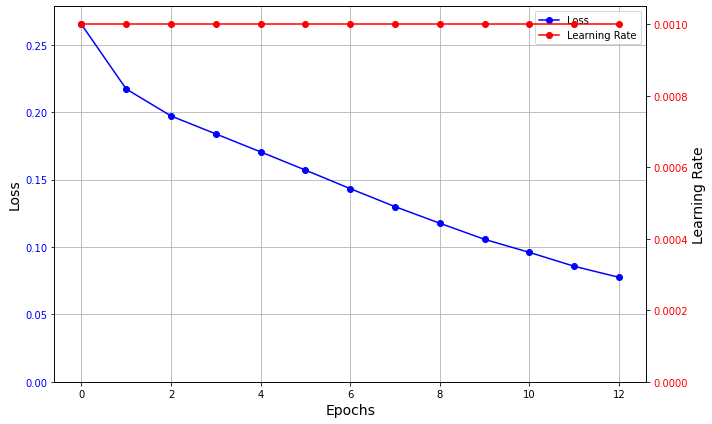

In [133]:
# Training
train_dataloader = DataLoader(master_dataset_franka, batch_size=batch_size, shuffle=True)

lrs = [0.04, 0.001]
lr_threshold = 0.0005
for ii in [1]:#range(len(models)):
    model = models[ii]
    #model.lstm.flatten_parameters()
    
    lr = lrs[ii]
    print('-----------------------------   ', models_names[ii],'----------------------------- ')
    #  training on source robot
    #model, loss_seq, lr_seq = train_loop(model, train_datasetloader,selected_features, lr, n_epochs[ii])
    model.train()
    # Use Adam optimizer and CrossEntropyLoss as the loss function
    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=1e-5)
    # Initialize learning rate scheduler
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=1, verbose=True)
    loss_seq = []
    lr_seq = []
    # Training loop
    for epoch in range(n_epochs[ii]):
        running_loss = []
        
        for X_batch, y_batch in train_dataloader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device) # Move data to device
            optimizer.zero_grad()
            # Generate noise and shift as PyTorch tensors
            y_pred = model(X_batch)
            y_batch = create_hierarchical_labels(y_batch, dof)
            loss = loss_fn(y_pred, y_batch)
            
            loss.backward()
            optimizer.step()
            running_loss.append(loss.cpu().detach().numpy())

        avg_loss = np.mean(running_loss)
        print(f"Epoch: {epoch + 1}/{n_epochs} - learning rate: {optimizer.param_groups[0]['lr']:.5f}, classification loss: {avg_loss:.4f}")
        # Update the scheduler with the average loss
        scheduler.step(avg_loss)
        current_lr = optimizer.param_groups[0]['lr']
        if current_lr < lr_threshold:
            print(f"Learning rate has dropped below the threshold of {lr_threshold}. Stopping training.")
            break
        loss_seq.append(avg_loss)
        lr_seq.append(current_lr)
        if avg_loss < 0.085:
            print('early stopping!')
            break

    plot_loss(loss_seq, lr_seq)
     
    # Validation
    #pre_training_accuracies = validation(test_dataloaders, dataloaders_names, model)
    #print(pre_training_accuracies)

In [134]:
# Testing
dataset_info = {
    os.getcwd().replace('AIModels', '') + '/dataset/franka_main/labeled_data/': 7}
''',
    os.getcwd().replace('AIModels', '') + '/dataset/ur5/labeled_data/': 6,
    os.getcwd().replace('AIModels', '') + '/dataset/franka_mindlab/labeled_data/': 7
}'''
dict_label = {'link7': 7, 'link6':6, 'link5':5, 'link4':4, 'link3':3, 'link2':2, 'link1':1, 'no_contact': 0}
selected_features = [f'e{i}' for i in range(7)]#+[ f'de{i}' for i in range(robot_dof)]

n = 14  # Window size for majority voting

model = models[1].eval()

# Loop through each dataset path and corresponding dof
for data_path, dof in dataset_info.items():
    print(data_path)
    # Load the dataset for testing
    testing_datasets = LoadDatasets(data_path, dict_label)
    test_datasetloader = DataLoader(testing_datasets, batch_size=1, shuffle=False)
    links = ['link7', 'link6', 'link5', 'link4', 'link3', 'link2', 'link1']
    for link in links:
        # Iterate through the dataset (trials)
        for trial_dataset_path, label in test_datasetloader:
            if link in trial_dataset_path[0]:
                # Load the dataset for the specific trial
                data = LoadSeqDataset(file_path=trial_dataset_path[0], label=label[0], 
                                    selected_features=selected_features[0:dof], seq_num=seq_num, gap=1)

                # Initialize an empty dataframe if not done before
                df = pd.DataFrame(columns=["time", "label", "model_out", "probability", "majority_voting"])

                # Create a DataLoader for this specific trial data
                test_loader = DataLoader(data, batch_size=len(data), shuffle=False)

                # Iterate through the DataLoader to make predictions
                for batch_idx, (seqs, labels) in enumerate(test_loader):
                    seqs = seqs.float().to(device)  # Convert sequences to float and move to device

                    # Perform the prediction without gradient computation
                    with torch.no_grad():
                        predictions = model.prediction(seqs)

                    # Fill the dataframe with the results
                    df['time'] = data.data.time[seq_num - 1:-1]
                    df['label'] = labels.cpu().numpy()  # Convert label to numpy
                    df['model_out'] = predictions.cpu().detach().numpy()  # Convert predictions to numpy
                    df['majority_voting'] = majority_voting_last_n(df['model_out'], n)

                # Plotting using Plotly (assuming you have plotly installed)
                df.iplot(x='time', y=['model_out', 'majority_voting', 'label'], 
                        colors=[ 'lightblue', 'darkblue', 'red'], 
                        title='Link ' + str(labels.max().item()))
                break
    

/home/rzma/myProjects/contactInterpretation//dataset/franka_main/labeled_data/


In [21]:
def contact_detection_accuracy(df, allowable_delay = 20):
    "df should include label, majority voting and time"
    TP, TN, FP, FN = 0, 0, 0, 0
    
    df['label_diff'] = df['label'].diff().fillna(0)
    df['TP'], df['TN'], df['FP'], df['FN'] = None, None, None, None

    contact_delays = []
    no_contact_delays = []
    df = df.reset_index(drop=True)

    change_events = df[df['label_diff'] != 0].index.tolist()

    # Add first and last index if not present
    if 0 not in change_events:
        change_events.insert(0, 0)
    if len(df) - 1 not in change_events:
        change_events.append(len(df) - 1)

    for event_idx in range(len(change_events) - 1):
        idx = change_events[event_idx]
        
        if df.label[idx] == 1: # Starting a contact event
            for i in range(idx, min(idx + allowable_delay, len(df))):
                if df.majority_voting[i] == 1:
                    delay = df.time[i] - df.time[idx]
                    contact_delays.append(delay)
                    break
            
            if i >= (idx + allowable_delay - 1):
                contact_delays.append(0)

            # Calculate TP and FN
            for j in range(change_events[event_idx+1], max(change_events[event_idx+1]-allowable_delay, 0), -1):
                if df.majority_voting[j] == 1:
                    break

            for idx_ in range(i, j):
                if df.majority_voting[idx_] == df.label[idx_]:
                    TP += 1
                    df.loc[idx_, 'TP'] = 0.9
                else:
                    FN += 1
                    df.loc[idx_, 'FN'] = 0.9

        else: # Starting a contact-free event

            for i in range(idx, min(idx + allowable_delay, len(df))):
                if df.majority_voting[i] == 0:
                    delay = df.time[i] - df.time[idx]
                    no_contact_delays.append(delay)
                    break
            
            if i >= (idx + allowable_delay - 1):
                no_contact_delays.append(0)

            # Calculate TN and FP
            for j in range(change_events[event_idx+1], max(change_events[event_idx+1]-allowable_delay, 0), -1):
                if df.majority_voting[j] == 0:
                    break
                
            for idx_ in range(i, j):
                if df.majority_voting[idx_] == df.label[idx_]:
                    TN += 1
                    df.loc[idx_, 'TN'] = 0.1
                else:
                    FP += 1
                    df.loc[idx_, 'FP'] = 0.1

    # Compute averages safely
    contact_avg_delay = np.nanmean([d for d in contact_delays if d > 0])
    no_contact_avg_delay = np.nanmean([d for d in no_contact_delays if d > 0])

    ModelAccuracy = (TP + TN) / (TP + TN + FP + FN) * 100
    DetectionFailureRate = FN / (TP + FN) * 100
    FalseAlarmRate = FP / (TN + FP) * 100

    return df, TP, TN, FP, FN, contact_avg_delay, no_contact_avg_delay, ModelAccuracy, DetectionFailureRate, FalseAlarmRate, contact_delays, no_contact_delays

# Call the function
df, TP, TN, FP, FN, contact_avg_delay, no_contact_avg_delay, ModelAccuracy, DetectionFailureRate, FalseAlarmRate, contact_delays, no_contact_delays = contact_detection_accuracy(df, 20)

print('contact_delays:', contact_delays)
print('no_contact_delays:', no_contact_delays)
print(f"Accuracy:{ModelAccuracy:.2f}%, DetectionFailureRate:{DetectionFailureRate:.2f}%, FalseAlarmRate:{FalseAlarmRate:.2f}%, Contact Detection Delay: {contact_avg_delay*1000:.3f}ms, No-Contact Detection Delay: {no_contact_avg_delay*1000:.3f}ms, TP: {TP}, TN: {TN}, FP: {FP}, FN: {FN}")

# Plot results
df[['time', 'label', 'majority_voting', 'TP', 'TN', 'FP', 'FN']].iplot(
    x='time', kind='scatter', 
    mode={'label': 'lines', 'majority_voting': 'lines', 'TP': 'markers', 'TN': 'markers', 'FP': 'markers', 'FN': 'markers'},
    title='Contact Detection Analysis (Interactive)',
    xTitle='Time Index', yTitle='Signal', theme='white',
    symbol=[None, None, 'x', 'x', 'x', 'x'],
    colors=['blue', 'pink', 'green', 'lightgreen', 'orange', 'red'],
)


contact_delays: [0, 0, 0, 0, 0, 0, 0, 0]
no_contact_delays: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Accuracy:63.75%, DetectionFailureRate:100.00%, FalseAlarmRate:0.00%, Contact Detection Delay: nanms, No-Contact Detection Delay: nanms, TP: 0, TN: 626, FP: 0, FN: 356


/home/rzma/miniconda3/envs/frankapyenv/lib/python3.6/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

Mean of empty slice

/home/rzma/miniconda3/envs/frankapyenv/lib/python3.6/site-packages/ipykernel_launcher.py:72: RuntimeWarning:

Mean of empty slice



# Training all models

In [11]:
# hyperparameters
import pickle, logging
accuracy_metric = Accuracy()

loss_fn = nn.CrossEntropyLoss()
loss_fn = nn.BCEWithLogitsLoss()
#loss_fn = nn.MultiLabelSoftMarginLoss()

lrs = [0.04, 0.004]
lr_threshold = 0.0005
n_epochs = [35, 15]
n = 14  # Window size for majority voting
batch_size = 70
data_name , dof= 'franka_main', 7 #franka_main, ur5
split_rate = 0.75

torch.manual_seed(2020)
np.random.seed(2020)
random.seed(2020)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

if device.type == "cuda":
    print("Using GPU:", torch.cuda.get_device_name())

main_path = os.getcwd().replace('AIModels', '')
dataset_info = {os.getcwd().replace('AIModels', '') + f'/dataset/{data_name}/labeled_data/': dof}
logging.basicConfig(
    level=logging.INFO,  # Set the logging level to INFO
    format='%(asctime)s - %(levelname)s - %(message)s',
    handlers=[
        logging.StreamHandler(),  # Print log to console
        logging.FileHandler(os.getcwd() + f'/training_out/contact_detection/{data_name}_training_log_batch_size{batch_size}_{time.time()}.txt')#num_layers{num_layers}_hidden_size{hidden_size}.txt')  # Save log to a single file
    ]
)
dict_label = {'link7': 1, 'link6':1, 'link5':1, 'link4':1, 'link3':1, 'link2':1, 'link1':1, 'no_contact': 0}
selected_features = [f'e{i}' for i in range(dof)]#+[ f'de{i}' for i in range(robot_dof)]


for num_layers in [1,2,3]:
    for hidden_size in [32, 64, 128, 256]:
        for seq_num in [30, 50, 80, 100, 150, 200]:
            for gap in [3, 5, 10, 15]:
                # Load the dataset from the file _half_0_75_0_3
                with open(f'{main_path}/dataset/{data_name}/pickleDatasets/{data_name}_feature_e_gap_{gap}_splitRate_{split_rate}_seqNum_{seq_num}.pickle', 'rb') as f:
                    master_dataset = pickle.load(f)

                # Training
                train_dataloader = DataLoader(master_dataset, batch_size=batch_size, shuffle=True)

                # Build the model
                #model_lstmBlock = lstmBlock(num_features_joints=seq_num, num_layers=num_layers, hidden_size=64, dropout=0.2, bidirectional=True)
                model_cnnLSTM = cnnLSTM(num_features_joints=seq_num, num_layers=num_layers, hidden_size=hidden_size, dropout=0.7, bidirectional=True)
                models = [model_cnnLSTM, model_cnnLSTM]
                models_names = ['model_lstmBlock',  'model_cnnLSTM',]
                for model in models:
                    model.to(device)
                    
                for ii in [1]:#range(len(models)):
                    model = models[ii]
                    #model.lstm.flatten_parameters()
                    
                    lr = lrs[ii]
                    logging.info(f'------------  {models_names[ii]} , num_layers = {num_layers}, hidden_size={hidden_size} seq_num = {seq_num}, gap = {gap}, --------------')
                    #  training on source robot
                    #model, loss_seq, lr_seq = train_loop(model, train_datasetloader,selected_features, lr, n_epochs[ii])
                    model.train()
                    # Use Adam optimizer and CrossEntropyLoss as the loss function
                    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=1e-5)
                    # Initialize learning rate scheduler
                    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=1, verbose=True)
                    loss_seq = []
                    lr_seq = []
                    # Training loop
                    for epoch in range(n_epochs[ii]):
                        running_loss = []
                        
                        for X_batch, y_batch in train_dataloader:
                            X_batch, y_batch = X_batch.to(device), y_batch.to(device) # Move data to device
                            optimizer.zero_grad()
                            y_pred = model(X_batch)
                            y_batch = create_hierarchical_labels(y_batch, dof)
                            loss = loss_fn(y_pred, y_batch)            
                            loss.backward()
                            optimizer.step()
                            running_loss.append(loss.cpu().detach().numpy())

                        avg_loss = np.mean(running_loss)
                        #print(f"Epoch: {epoch + 1}/{n_epochs} - learning rate: {optimizer.param_groups[0]['lr']:.5f}, classification loss: {avg_loss:.4f}")
                        # Update the scheduler with the average loss
                        scheduler.step(avg_loss)
                        current_lr = optimizer.param_groups[0]['lr']
                        if current_lr < lr_threshold:
                            print(f"Learning rate has dropped below the threshold of {lr_threshold}. Stopping training.")
                            break
                        loss_seq.append(avg_loss)
                        lr_seq.append(current_lr)
                        if avg_loss < 0.08:
                            print('early stopping <0.08!')
                            break
                    #logging.info(f'loss = {loss_seq}')
                    #logging.info(f'lr = {lr_seq}')
                    model.eval()
                    os.makedirs(f'{main_path}/dataset/{data_name}/trained_models/contact_detection/{batch_size}/', exist_ok=True)
                    accuracies = []
                    # Loop through each dataset path and corresponding dof
                    for data_path, dof in dataset_info.items():
                        # Load the dataset for testing
                        testing_datasets = LoadDatasets(data_path, dict_label)
                        test_datasetloader = DataLoader(testing_datasets, batch_size=1, shuffle=False)
                        
                        for trial_dataset_path, label in test_datasetloader:
                            if 'link1' in trial_dataset_path[0]:
                                # Load the dataset for the specific trial
                                data = LoadSeqDataset(file_path=trial_dataset_path[0], label=label[0], 
                                                    selected_features=selected_features[0:dof], seq_num=seq_num, gap=1)
                                data.sequences = data.sequences[(len(data)-len(data)//2):len(data)]
                                # Initialize an empty dataframe if not done before
                                df = pd.DataFrame(columns=["time", "label", "model_out", "probability", "majority_voting"])

                                # Create a DataLoader for this specific trial data
                                test_loader = DataLoader(data, batch_size=len(data), shuffle=False)

                                # Iterate through the DataLoader to make predictions
                                for batch_idx, (seqs, labels) in enumerate(test_loader):
                                    seqs = seqs.float().to(device)  # Convert sequences to float and move to device

                                    # Perform the prediction without gradient computation
                                    with torch.no_grad():
                                        predictions = model.prediction(seqs)

                                    # Fill the dataframe with the results
                                    df['time'] = data.data.time[len(data.data.time)-len(data)-1:-1]
                                    df['label'] = labels.cpu().numpy()  # Convert label to numpy
                                    df['model_out'] = predictions.cpu().detach().numpy()  # Convert predictions to numpy
                                    df['majority_voting'] = majority_voting_last_n(df['model_out'], n)

                                # Call the function
                                df, TP, TN, FP, FN, contact_avg_delay, no_contact_avg_delay, ModelAccuracy, DetectionFailureRate, FalseAlarmRate, contact_delays, no_contact_delays = contact_detection_accuracy(df)
                                print('contact_delays:', contact_delays)
                                print('no_contact_delays:', no_contact_delays)
                                logging.info(f"Accuracy:{ModelAccuracy:.2f}, DetectionFailurRate:{DetectionFailureRate:.2f}, FalseAlarm:{FalseAlarmRate:.2f}, Contact Detection Delay: {contact_avg_delay*1000:.3f}ms, No-Contact Detection Delay: {no_contact_avg_delay*1000:.3f}ms, TP: {TP}, TN: {TN}, FP: {FP}, FN: {FN}")

                                df[['time','label', 'majority_voting', 'TP', 'TN', 'FP', 'FN']].iplot( x='time',kind='scatter', 
                                    mode={'label': 'lines', 'majority_voting': 'lines', 'TP': 'markers', 'TN': 'markers', 'FP': 'markers', 'FN': 'markers', },
                                    title='Contact Detection Analysis (Interactive)',
                                    xTitle='Time Index',yTitle='Signal',theme='white',
                                    symbol=[None, None, 'x','x', 'x', 'x'],
                                    colors=['blue', 'pink', 'green', 'lightgreen', 'orange', 'red'],
                                )
                                break
                        torch.save(model.state_dict(), f'{main_path}/dataset/{data_name}/trained_models/contact_detection/{batch_size}/numLayer{num_layers}_hiddenSize{hidden_size}_seq_num{seq_num}_gap{gap}_accuracy{ModelAccuracy:.2f}')
                        break 

Using GPU: Quadro RTX 8000


/home/rzma/miniconda3/envs/frankapyenv/lib/python3.6/site-packages/ipykernel_launcher.py:72: RuntimeWarning:

Mean of empty slice



contact_delays: [0.089998245, 0.09005642, 0, 0.09001732, 0.08995247, 0.084999084, 0, 0.095044136, 0]
no_contact_delays: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


contact_delays: [0, 0, 0, 0, 0, 0, 0, 0]
no_contact_delays: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


/home/rzma/miniconda3/envs/frankapyenv/lib/python3.6/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

Mean of empty slice

/home/rzma/miniconda3/envs/frankapyenv/lib/python3.6/site-packages/ipykernel_launcher.py:72: RuntimeWarning:

Mean of empty slice



KeyboardInterrupt: 

## Accuracy calculation on all links

In [26]:
data_name, dof = 'franka_main', 7
batch_size = 70
best_models_index, folder_name, data_name, dof = ([ [1, 64, 3, 50 ],
                                                    [1, 64, 3, 80 ],
                                                    [1, 64, 3, 100 ],
                                                    [1, 64, 5, 50 ],
                                                    [1, 64, 5, 80 ],
                                                    [1, 64, 5, 100 ],
                                                    [1, 128, 3, 50 ],
                                                    [1, 128, 3, 80 ],
                                                    [1, 128, 3, 100 ],
                                                    [1, 128, 5, 50 ],
                                                    [1, 128, 5, 80 ],
                                                    [1, 128, 5, 100 ],
                                                        ], f'franka_main/trained_models/contact_detection/{batch_size}', f'{data_name}', dof)
dataset_info = {
os.getcwd().replace('AIModels', '') + f'/dataset/{data_name}/labeled_data/': dof
}

'''best_models_index = [[1, 128, 3, 80],
                     [1, 128, 3, 100],
                     [1, 64, 3, 100]]'''
# hyperparameters

n = 14  # Window size for majority voting

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

if device.type == "cuda":
    print("Using GPU:", torch.cuda.get_device_name())

main_path = os.getcwd().replace('AIModels', '')


logging.info(f'trained on {folder_name}, test on {data_name}')
dict_label = {'link7': 1, 'link6':1, 'link5':1, 'link4':1, 'link3':1, 'link2':1, 'link1':1, 'no_contact': 0}
selected_features = [f'e{i}' for i in range(dof)]#+[ f'de{i}' for i in range(robot_dof)]

best_models_index=[]
counter = 1
links = ['link7', 'link6', 'link5', 'link4', 'link3', 'link2', 'link1']
links_label = {'link7':'a6', 'link6':'b9', 'link5':'c12', 'link4':'d5', 'link3':'e4', 'link2':'f5', 'link1':'g1'}

for num_layers in [1, 2, 3]:
    for hidden_size in [32, 64, 128, 256]:
        for seq_num in [30, 50, 80, 100, 150, 200]:
            for gap in [3, 5, 10, 15]:
                best_models_index.append([num_layers, hidden_size, gap, seq_num])



for num_layers, hidden_size, gap, seq_num in best_models_index:
    for model_name in os.listdir(f'{main_path}/dataset/{folder_name}/'):
        if f'numLayer{num_layers}_hiddenSize{hidden_size}_seq_num{seq_num}_gap{gap}' in model_name:
            counter +=1
            model = cnnLSTM(num_features_joints=seq_num, num_layers=num_layers, hidden_size=hidden_size, dropout=0.7, bidirectional=True)
            model.to(device)
            model.load_state_dict(torch.load(f'{main_path}/dataset/{folder_name}/{model_name}'))
            model.eval()
            y_pred, y_true= [], []

            for data_path, dof in dataset_info.items():
                # Load the dataset for testing
                testing_datasets = LoadDatasets(data_path, dict_label)
                test_datasetloader = DataLoader(testing_datasets, batch_size=1, shuffle=False)
                TN_t, TP_t, FP_t, FN_t = 0,0,0,0
                contact_avg_delay_t, no_contact_avg_delay_t=[],[]

                for link in links:
                    # Iterate through the dataset (trials)
                    for trial_dataset_path, label in test_datasetloader:
                        if link in trial_dataset_path[0]:
                            if data_name== 'franka_main' and links_label[link] not in trial_dataset_path[0]:
                                pass
                            else:
                                # Load the dataset for the specific trial
                                data = LoadSeqDataset(file_path=trial_dataset_path[0], label=label[0], 
                                                    selected_features=selected_features[0:dof], seq_num=seq_num, gap=1)
                                data.sequences = data.sequences[(len(data)-len(data)//2):-1]
                                # Initialize an empty dataframe if not done before
                                df = pd.DataFrame(columns=["time", "label", "model_out", "probability", "majority_voting"])

                                # Create a DataLoader for this specific trial data
                                test_loader = DataLoader(data, batch_size=len(data), shuffle=False)

                                # Iterate through the DataLoader to make predictions
                                for batch_idx, (seqs, labels) in enumerate(test_loader):
                                    seqs = seqs.float().to(device)  # Convert sequences to float and move to device

                                    # Perform the prediction without gradient computation
                                    with torch.no_grad():
                                        predictions = model.prediction(seqs)

                                    # Fill the dataframe with the results
                                    df['time'] = data.data.time[len(data.data.time)-len(data)-1:-1]
                                    df['label'] = labels.cpu().numpy()  # Convert label to numpy
                                    df['model_out'] = predictions.cpu().detach().numpy()  # Convert predictions to numpy
                                    df['majority_voting'] = majority_voting_last_n(df['model_out'], n)

                                    df, TP, TN, FP, FN, contact_avg_delay, no_contact_avg_delay, ModelAccuracy, DetectionFailureRate, FalseAlarmRate, contact_delays, no_contact_delays = contact_detection_accuracy(df)
                                    '''print('contact_delays:', contact_delays)
                                    print('no_contact_delays:', no_contact_delays)
                                    print(f"Accuracy:{ModelAccuracy:.2f}, DetectionFailurRate:{DetectionFailureRate:.2f}, FalseAlarm:{FalseAlarmRate:.2f}, Contact Detection Delay: {contact_avg_delay*1000:.3f}ms, No-Contact Detection Delay: {no_contact_avg_delay*1000:.3f}ms, TP: {TP}, TN: {TN}, FP: {FP}, FN: {FN}")

                                    df[['time','label', 'majority_voting', 'TP', 'TN', 'FP', 'FN']].iplot( x='time',kind='scatter', 
                                        mode={'label': 'lines', 'majority_voting': 'lines', 'TP': 'markers', 'TN': 'markers', 'FP': 'markers', 'FN': 'markers', },
                                        title=f'Contact Detection Analysis ({link})',
                                        xTitle='Time Index',yTitle='Signal',theme='white',
                                        symbol=[None, None, 'x','x', 'x', 'x'],
                                        colors=['blue', 'pink', 'green', 'lightgreen', 'orange', 'red'],
                                    )'''
                                    TP_t, TN_t, FP_t, FN_t = TP_t + TP, TN_t + TN, FP_t + FP, FN_t + FN
                                    contact_avg_delay_t.append(contact_avg_delay)
                                    no_contact_avg_delay_t.append(no_contact_avg_delay)
                                break
                filtered_contact_avg = [x for x in contact_avg_delay_t if x != 0 and not np.isnan(x)]
                filtered_no_contact_avg = [x for x in no_contact_avg_delay_t if x != 0 and not np.isnan(x)]

                contact_avg_delay_t = np.mean(filtered_contact_avg)
                no_contact_avg_delay_t = np.mean(filtered_no_contact_avg)
                logging.info(f"Testing: {hidden_size}, {gap}, {seq_num}, Accuracy:{(TP_t+TN_t)/(TP_t+TN_t+FP_t+FN_t)*100:.2f}, DetectionFailurRate:{FN_t/(FN_t+TP_t)*100:.2f}, FalseAlarm:{FP_t/(FP_t+TN_t)*100:.2f}, Contact Detection Delay: {contact_avg_delay_t*1000:.2f}ms, No-Contact Detection Delay: {no_contact_avg_delay_t*1000:.2f}ms, TP: {TP_t}, TN: {TN_t}, FP: {FP_t}, FN: {FN_t}")


Using GPU: Quadro RTX 8000


/home/rzma/miniconda3/envs/frankapyenv/lib/python3.6/site-packages/ipykernel_launcher.py:72: RuntimeWarning:

Mean of empty slice

/home/rzma/miniconda3/envs/frankapyenv/lib/python3.6/site-packages/ipykernel_launcher.py:72: RuntimeWarning:

Mean of empty slice

/home/rzma/miniconda3/envs/frankapyenv/lib/python3.6/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

Mean of empty slice

/home/rzma/miniconda3/envs/frankapyenv/lib/python3.6/site-packages/ipykernel_launcher.py:72: RuntimeWarning:

Mean of empty slice

/home/rzma/miniconda3/envs/frankapyenv/lib/python3.6/site-packages/ipykernel_launcher.py:72: RuntimeWarning:

Mean of empty slice

/home/rzma/miniconda3/envs/frankapyenv/lib/python3.6/site-packages/ipykernel_launcher.py:72: RuntimeWarning:

Mean of empty slice

/home/rzma/miniconda3/envs/frankapyenv/lib/python3.6/site-packages/ipykernel_launcher.py:72: RuntimeWarning:

Mean of empty slice

/home/rzma/miniconda3/envs/frankapyenv/lib/python3.6/site-packages/ipykernel_launch

In [25]:
f'{main_path}/dataset/{folder_name}/{model_name}'

'/home/rzma/myProjects/contactInterpretation//dataset/franka_main/trained_models/contact_detection/62/numLayer1_hiddenSize64_seq_num80_gap3_accuracy96.40'

# 4. Transfer Learning

In [43]:
# load target data
data_path, robot_dof = (os.getcwd().replace('AIModels','') +'/dataset/franka_mindlab/labeled_data/', 7)
#data_path, robot_dof = (os.getcwd().replace('AIModels','') +'/dataset/ur5/labeled_data/', 6)
dict_label  = {'link7': 1, 'link6':1, 'link5':1, 'link4':1, 'link3':1, 'link2':1, 'link1':1, 'no_contact': 0}

'''seq_num = 64
gap = 5'''
selected_features = [f'e{i}' for i in range(robot_dof)]#+[ f'de{i}' for i in range(robot_dof)]


# Load data and create training and testing sets

testing_datasets = LoadDatasets(data_path, dict_label)
test_datasetloader = DataLoader(testing_datasets, batch_size=1, shuffle=True)

# Initialize counters
total_samples_counter = 0
train_samples_counter = 0
master_dataset = []

# Iterate through test_datasetloader
for trial_dataset_path, label in test_datasetloader:
    # Load the dataset for the trial
    data = LoadSeqDataset(file_path=trial_dataset_path[0], label=label[0], selected_features=selected_features, seq_num=seq_num, gap=gap)

    ''' # Count total samples
    total_samples = len(data)
    total_samples_counter += total_samples

    # Calculate number of samples for the subset (5% of the data)
    num_samples = int(0.2 * total_samples)
    train_samples_counter += num_samples

    # Randomly sample indices
    indices = torch.randperm(total_samples).tolist()[:num_samples]

    # Create a subset of the data
    subset_data = Subset(data, indices)'''
    
    # Count total samples
    total_samples = len(data)
    total_samples_counter += total_samples

    data.balanceData(split_rate_1=0.7, split_rate_0=0.4)
    # Calculate number of samples for the subset (5% of the data)
    num_samples = len(data)
    train_samples_counter += num_samples
    master_dataset.append(data)

# Combine all subsets into a single dataset
master_dataset_ur5 = ConcatDataset(master_dataset)

# Create a DataLoader for the combined dataset
train_dataloader = DataLoader(master_dataset_ur5, batch_size=batch_size, shuffle=True)

unique_labels, counts = 0 , 0
for X_batch, y_batch in train_dataloader:
    unique_labels, b = y_batch.unique(return_counts=True)
    counts += b
print(f"Total samples across all trials: {total_samples_counter}")
print(f"Total samples used for training ({train_samples_counter//total_samples_counter*100}% of data): {train_samples_counter}")
print(f"Unique labels: {unique_labels}")
print(f"Counts: {counts}")
print(f"Batch shape: {y_batch.shape}")

Total samples across all trials: 18817
Total samples used for training (0% of data): 9641
Unique labels: tensor([0, 1])
Counts: tensor([4687, 4954])
Batch shape: torch.Size([41])


## Fine Tuning

-----------------------------    model_cnnLSTM ----------------------------- 
Epoch: 1/[25, 10] - learning rate: 0.00100, classification loss: 0.5169
Epoch: 2/[25, 10] - learning rate: 0.00100, classification loss: 0.3556
Epoch: 3/[25, 10] - learning rate: 0.00100, classification loss: 0.2628
Epoch: 4/[25, 10] - learning rate: 0.00100, classification loss: 0.1857
Epoch: 5/[25, 10] - learning rate: 0.00100, classification loss: 0.1251
Epoch: 6/[25, 10] - learning rate: 0.00100, classification loss: 0.0960
Epoch: 7/[25, 10] - learning rate: 0.00100, classification loss: 0.0660
Epoch: 8/[25, 10] - learning rate: 0.00100, classification loss: 0.0544
Epoch: 9/[25, 10] - learning rate: 0.00100, classification loss: 0.0486
Epoch: 10/[25, 10] - learning rate: 0.00100, classification loss: 0.0401


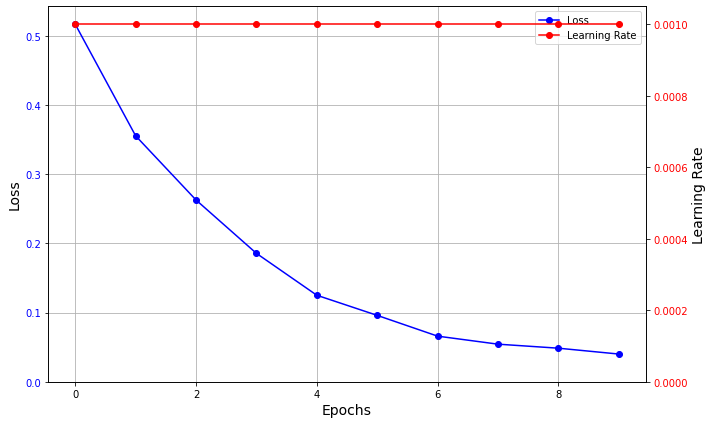

In [44]:
# training
train_dataloader = DataLoader(master_dataset_ur5, batch_size=batch_size, shuffle=True)

models_da = copy.deepcopy(models)

n_epochs = [25, 10]
lrs = [0.01, 0.001]

lr_threshold = 0.0005

for ii in [1]:#range(len(models)):
    model = models_da[ii]
    #model.lstm.flatten_parameters()
    
    lr = lrs[ii]
    print('-----------------------------   ', models_names[ii],'----------------------------- ')
    #  training on source robot
    #model, loss_seq, lr_seq = train_loop(model, train_datasetloader,selected_features, lr, n_epochs[ii])
    model.train()
    # Use Adam optimizer and CrossEntropyLoss as the loss function
    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=1e-5)
    # Initialize learning rate scheduler
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=1, verbose=True)
    loss_seq = []
    lr_seq = []
    # Training loop
    for epoch in range(n_epochs[ii]):
        running_loss = []
        
        for X_batch, y_batch in train_dataloader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device) # Move data to device
            optimizer.zero_grad()
            # Generate noise and shift as PyTorch tensors
            y_pred = model(X_batch, freeze_last_layer = True)
            y_batch = create_hierarchical_labels(y_batch, robot_dof)
            loss = loss_fn(y_pred, y_batch)
            
            loss.backward()
            optimizer.step()
            running_loss.append(loss.cpu().detach().numpy())

        avg_loss = np.mean(running_loss)
        print(f"Epoch: {epoch + 1}/{n_epochs} - learning rate: {optimizer.param_groups[0]['lr']:.5f}, classification loss: {avg_loss:.4f}")
        # Update the scheduler with the average loss
        scheduler.step(avg_loss)
        current_lr = optimizer.param_groups[0]['lr']
        if current_lr < lr_threshold:
            print(f"Learning rate has dropped below the threshold of {lr_threshold}. Stopping training.")
            break
        loss_seq.append(avg_loss)
        lr_seq.append(current_lr)

    plot_loss(loss_seq, lr_seq)
     

In [45]:
# Testing
dataset_info = {
    os.getcwd().replace('AIModels', '') + '/dataset/franka_mindlab/labeled_data/': 7,
    os.getcwd().replace('AIModels', '') + '/dataset/ur5/labeled_data/': 6,
    os.getcwd().replace('AIModels', '') + '/dataset/franka_main/labeled_data/': 7
}
dict_label = {'link7': 7, 'link6':6, 'link5':5, 'link4':4, 'link3':3, 'link2':2, 'link1':1, 'no_contact': 0}
selected_features = [f'e{i}' for i in range(7)]#+[ f'de{i}' for i in range(robot_dof)]

n = 14  # Window size for majority voting

model = models_da[1].eval()

# Loop through each dataset path and corresponding dof
for data_path, dof in dataset_info.items():
    print(data_path)
    # Load the dataset for testing
    testing_datasets = LoadDatasets(data_path, dict_label)
    test_datasetloader = DataLoader(testing_datasets, batch_size=1, shuffle=False)

    # Iterate through the dataset (trials)
    for trial_dataset_path, label in test_datasetloader:
        if 'link2' in trial_dataset_path[0]:
            # Load the dataset for the specific trial
            data = LoadSeqDataset(file_path=trial_dataset_path[0], label=label[0], 
                                selected_features=selected_features[0:dof], seq_num=seq_num, gap=1)

            # Initialize an empty dataframe if not done before
            df = pd.DataFrame(columns=["time", "label", "model_out", "probability", "majority_voting"])

            # Create a DataLoader for this specific trial data
            test_loader = DataLoader(data, batch_size=len(data), shuffle=False)

            # Iterate through the DataLoader to make predictions
            for batch_idx, (seqs, labels) in enumerate(test_loader):
                seqs = seqs.float().to(device)  # Convert sequences to float and move to device

                # Perform the prediction without gradient computation
                with torch.no_grad():
                    predictions = model.prediction(seqs)

                # Fill the dataframe with the results
                df['time'] = data.data.time[seq_num - 1:-1]
                df['label'] = labels.cpu().numpy()  # Convert label to numpy
                df['model_out'] = predictions.cpu().detach().numpy()  # Convert predictions to numpy
                df['majority_voting'] = majority_voting_last_n(df['model_out'], n)

            # Plotting using Plotly (assuming you have plotly installed)
            df.iplot(x='time', y=['model_out', 'majority_voting', 'label'], 
                    colors=[ 'lightblue', 'darkblue', 'red'], 
                    title='Link ' + str(labels.max().item()))
            break


/home/rzma/myProjects/contactInterpretation//dataset/franka_mindlab/labeled_data/


/home/rzma/myProjects/contactInterpretation//dataset/ur5/labeled_data/


/home/rzma/myProjects/contactInterpretation//dataset/franka_main/labeled_data/


## Fine Tuning All

In [72]:
import pickle, logging
data_name, dof = 'franka_mindlab', 7
best_models_index, folder_name, data_name,batch_size, dof = ([   [1, 64, 3, 50 ],
                                                                  [1, 64, 3, 80 ],
                                                                  [1, 64, 3, 100 ],
                                                                  [1, 128, 3, 50 ],
                                                                  [1, 128, 3, 80 ],
                                                                  [1, 128, 3, 100 ],
                                                                  [1, 64, 5, 50 ],
                                                                  [1, 64, 5, 80 ],
                                                                  [1, 64, 5, 100 ],
                                                                  [1, 128, 5, 50 ],
                                                                  [1, 128, 5, 80 ],
                                                                  [1, 128, 5, 100 ],
                                                                      ], 'franka_main/trained_models/contact_detection/63', f'{data_name}',66, dof)


lrs = [0.04, 0.001]
lr_threshold = 0.0005
n_epochs = [35, 20]
n = 14  # Window size for majority voting
logging.info(f'Fine-tuning from {folder_name} on {data_name}')
torch.manual_seed(2020)
np.random.seed(2020)
random.seed(2020)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

if device.type == "cuda":
    print("Using GPU:", torch.cuda.get_device_name())

main_path = os.getcwd().replace('AIModels', '')
dataset_info = {os.getcwd().replace('AIModels', '') + f'/dataset/{data_name}/labeled_data/': dof}

#dict_label = {'link7': 7, 'link6':6, 'link5':5, 'link4':4, 'link3':3, 'link2':2, 'link1':1, 'no_contact': 0}
selected_features = [f'e{i}' for i in range(dof)]#+[ f'de{i}' for i in range(robot_dof)]

links = ['link7', 'link6', 'link5', 'link4', 'link3', 'link2', 'link1']


for num_layers, hidden_size, gap, seq_num in best_models_index:
    #for gap in [3]:#, 5]:#, 10, 15]:
        # Load the dataset from the file
        with open(f'{main_path}/dataset/{data_name}/pickleDatasets/{data_name}_feature_e_gap_{gap}_splitRate_{split_rate}_seqNum_{seq_num}.pickle', 'rb') as f:
            master_dataset = pickle.load(f)
    
        # Training
        train_dataloader = DataLoader(master_dataset, batch_size=batch_size, shuffle=True)

        for model_name in os.listdir(f'{main_path}/dataset/{folder_name}/'):
            if f'hiddenSize{hidden_size}_seq_num{seq_num}_gap{gap}' in model_name:
                # Build the model
                print(model_name)
                model = cnnLSTM(num_features_joints=seq_num, num_layers=num_layers, hidden_size=hidden_size, dropout=0.7, bidirectional=True)
                model.to(device)
                model.load_state_dict(torch.load(f'{main_path}/dataset/{folder_name}/{model_name}'))
                model.train()
                    
                lr = lrs[1]
                #print(f'------------  {models_names[ii]} , num_layers = {num_layers}, hidden_size={hidden_size} seq_num = {seq_num}, gap = {gap}, --------------')
                optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=1e-5)
                scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=1, verbose=True)
                loss_seq = []
                lr_seq = []
                # Training loop
                for epoch in range(n_epochs[1]):
                    running_loss = []
                    
                    for X_batch, y_batch in train_dataloader:
                        X_batch, y_batch = X_batch.to(device), y_batch.to(device) # Move data to device
                        optimizer.zero_grad()
                        y_pred = model(X_batch)
                        y_batch = create_hierarchical_labels(y_batch, dof)
                        loss = loss_fn(y_pred, y_batch)            
                        loss.backward()
                        optimizer.step()
                        running_loss.append(loss.cpu().detach().numpy())

                    avg_loss = np.mean(running_loss)
                    print(f"Epoch: {epoch + 1}/{n_epochs} - learning rate: {optimizer.param_groups[0]['lr']:.5f}, classification loss: {avg_loss:.4f}")
                    # Update the scheduler with the average loss
                    scheduler.step(avg_loss)
                    current_lr = optimizer.param_groups[0]['lr']
                    if current_lr < lr_threshold:
                        print(f"Learning rate has dropped below the threshold of {lr_threshold}. Stopping training.")
                        break
                    loss_seq.append(avg_loss)
                    lr_seq.append(current_lr)
                    if avg_loss < 0.085:
                        print('early stopping <0.47!')
                        break
                #logging.info(f'loss = {loss_seq}')
                #logging.info(f'lr = {lr_seq}')
                model.eval()
                os.makedirs(f'{main_path}/dataset/{data_name}/trained_models/contact_detection/fine_tuned{batch_size}/', exist_ok=True)
                accuracies = []
                # Loop through each dataset path and corresponding dof
                for data_path, dof in dataset_info.items():
                    # Load the dataset for testing
                    testing_datasets = LoadDatasets(data_path, dict_label)
                    test_datasetloader = DataLoader(testing_datasets, batch_size=1, shuffle=False)
                    
                    for trial_dataset_path, label in test_datasetloader:
                        if 'link1' in trial_dataset_path[0]:
                            # Load the dataset for the specific trial
                            data = LoadSeqDataset(file_path=trial_dataset_path[0], label=label[0], 
                                                selected_features=selected_features[0:dof], seq_num=seq_num, gap=1)
                            data.sequences = data.sequences[(len(data)-len(data)//2):len(data)]
                            # Initialize an empty dataframe if not done before
                            df = pd.DataFrame(columns=["time", "label", "model_out", "probability", "majority_voting"])

                            # Create a DataLoader for this specific trial data
                            test_loader = DataLoader(data, batch_size=len(data), shuffle=False)

                            # Iterate through the DataLoader to make predictions
                            for batch_idx, (seqs, labels) in enumerate(test_loader):
                                seqs = seqs.float().to(device)  # Convert sequences to float and move to device

                                # Perform the prediction without gradient computation
                                with torch.no_grad():
                                    predictions = model.prediction(seqs)

                                # Fill the dataframe with the results
                                df['time'] = data.data.time[len(data.data.time)-len(data)-1:-1]
                                df['label'] = labels.cpu().numpy()  # Convert label to numpy
                                df['model_out'] = predictions.cpu().detach().numpy()  # Convert predictions to numpy
                                df['majority_voting'] = majority_voting_last_n(df['model_out'], n)

                            df, TP, TN, FP, FN, contact_avg_delay, no_contact_avg_delay, ModelAccuracy, DetectionFailureRate, FalseAlarmRate, contact_delays, no_contact_delays = contact_detection_accuracy(df)
                            print('contact_delays:', contact_delays)
                            print('no_contact_delays:', no_contact_delays)
                            logging.info(f"Testing: {hidden_size}, {gap}, {seq_num}, Accuracy:{ModelAccuracy:.2f}, DetectionFailurRate:{DetectionFailureRate:.2f}, FalseAlarm:{FalseAlarmRate:.2f}, Contact Detection Delay: {contact_avg_delay*1000:.3f}ms, No-Contact Detection Delay: {no_contact_avg_delay*1000:.3f}ms, TP: {TP}, TN: {TN}, FP: {FP}, FN: {FN}")

                            df[['time','label', 'majority_voting', 'TP', 'TN', 'FP', 'FN']].iplot( x='time',kind='scatter', 
                                mode={'label': 'lines', 'majority_voting': 'lines', 'TP': 'markers', 'TN': 'markers', 'FP': 'markers', 'FN': 'markers', },
                                title=f'Contact Detection, {trial_dataset_path[0]}',
                                xTitle='Time Index',yTitle='Signal',theme='white',
                                symbol=[None, None, 'x','x', 'x', 'x'],
                                colors=['blue', 'pink', 'green', 'lightgreen', 'orange', 'red'],
                            )
                            break
                    torch.save(model.state_dict(), f'{main_path}/dataset/{data_name}/trained_models/contact_detection/fine_tuned{batch_size}/hiddenSize{hidden_size}_seq_num{seq_num}_gap{gap}_accuracy{ModelAccuracy:.2f}')
                    break 

2025-02-06 17:54:09,752 - INFO - Fine-tuning from franka_main/trained_models/contact_detection/63 on franka_mindlab


Using GPU: Quadro T2000
numLayer1_hiddenSize64_seq_num80_gap3_accuracy98.76
Epoch: 1/[35, 20] - learning rate: 0.00100, classification loss: 0.4233
Epoch: 2/[35, 20] - learning rate: 0.00100, classification loss: 0.2985
Epoch: 3/[35, 20] - learning rate: 0.00100, classification loss: 0.2489
Epoch: 4/[35, 20] - learning rate: 0.00100, classification loss: 0.2177
Epoch: 5/[35, 20] - learning rate: 0.00100, classification loss: 0.1906
Epoch: 6/[35, 20] - learning rate: 0.00100, classification loss: 0.1622
Epoch: 7/[35, 20] - learning rate: 0.00100, classification loss: 0.1395
Epoch: 8/[35, 20] - learning rate: 0.00100, classification loss: 0.1246
Epoch: 9/[35, 20] - learning rate: 0.00100, classification loss: 0.1047
Epoch: 10/[35, 20] - learning rate: 0.00100, classification loss: 0.0914
Epoch: 11/[35, 20] - learning rate: 0.00100, classification loss: 0.0792
early stopping <0.47!


2025-02-06 17:54:22,509 - INFO - Testing: 64, 3, 80, Accuracy:84.74, DetectionFailurRate:21.94, FalseAlarm:8.94, Contact Detection Delay: 70.015ms, No-Contact Detection Delay: 96.674ms, TP: 669, TN: 825, FP: 81, FN: 188


contact_delays: [0.0, 0.14003944, 0.02993393, 0.025001526, 0.0, 0.06498718, 0.07008171, 0.09004784]
no_contact_delays: [0, 0.08501625, 0.07502937, 0, 0.055023193, 0.11497879, 0.1450119, 0, 0.10498428]


numLayer1_hiddenSize64_seq_num100_gap3_accuracy95.68
Epoch: 1/[35, 20] - learning rate: 0.00100, classification loss: 0.3904
Epoch: 2/[35, 20] - learning rate: 0.00100, classification loss: 0.2842
Epoch: 3/[35, 20] - learning rate: 0.00100, classification loss: 0.2345
Epoch: 4/[35, 20] - learning rate: 0.00100, classification loss: 0.2032
Epoch: 5/[35, 20] - learning rate: 0.00100, classification loss: 0.1742
Epoch: 6/[35, 20] - learning rate: 0.00100, classification loss: 0.1457
Epoch: 7/[35, 20] - learning rate: 0.00100, classification loss: 0.1244
Epoch: 8/[35, 20] - learning rate: 0.00100, classification loss: 0.1094
Epoch: 9/[35, 20] - learning rate: 0.00100, classification loss: 0.0830
early stopping <0.47!


2025-02-06 17:54:33,323 - INFO - Testing: 64, 3, 100, Accuracy:86.31, DetectionFailurRate:11.80, FalseAlarm:15.40, Contact Detection Delay: 63.011ms, No-Contact Detection Delay: 93.582ms, TP: 740, TN: 780, FP: 142, FN: 99


contact_delays: [0.0, 0.10506344, 0.08997154, 0.015002251, 0.0, 0.044994354, 0.06002426, 0]
no_contact_delays: [0.070046425, 0.050001144, 0, 0.08000469, 0.14505386, 0, 0.13501167, 0.07501221, 0.099946976]


numLayer1_hiddenSize128_seq_num80_gap3_accuracy79.71
Epoch: 1/[35, 20] - learning rate: 0.00100, classification loss: 0.3835
Epoch: 2/[35, 20] - learning rate: 0.00100, classification loss: 0.2915
Epoch: 3/[35, 20] - learning rate: 0.00100, classification loss: 0.2517
Epoch: 4/[35, 20] - learning rate: 0.00100, classification loss: 0.2199
Epoch: 5/[35, 20] - learning rate: 0.00100, classification loss: 0.1965
Epoch: 6/[35, 20] - learning rate: 0.00100, classification loss: 0.1700
Epoch: 7/[35, 20] - learning rate: 0.00100, classification loss: 0.1392
Epoch: 8/[35, 20] - learning rate: 0.00100, classification loss: 0.1331
Epoch: 9/[35, 20] - learning rate: 0.00100, classification loss: 0.1027
Epoch: 10/[35, 20] - learning rate: 0.00100, classification loss: 0.0976
Epoch: 11/[35, 20] - learning rate: 0.00100, classification loss: 0.0898
Epoch: 12/[35, 20] - learning rate: 0.00100, classification loss: 0.0762
early stopping <0.47!


2025-02-06 17:54:47,004 - INFO - Testing: 128, 3, 80, Accuracy:84.77, DetectionFailurRate:14.71, FalseAlarm:15.72, Contact Detection Delay: 76.017ms, No-Contact Detection Delay: 101.988ms, TP: 713, TN: 729, FP: 136, FN: 123


contact_delays: [0.0, 0.11499882, 0.040042877, 0.04502392, 0.0, 0, 0.09504509, 0.0849762]
no_contact_delays: [0.06496525, 0.13000965, 0, 0, 0, 0.07997513, 0.1450119, 0, 0.089977264]


numLayer1_hiddenSize128_seq_num100_gap3_accuracy100.00
Epoch: 1/[35, 20] - learning rate: 0.00100, classification loss: 0.3688
Epoch: 2/[35, 20] - learning rate: 0.00100, classification loss: 0.2754
Epoch: 3/[35, 20] - learning rate: 0.00100, classification loss: 0.2357
Epoch: 4/[35, 20] - learning rate: 0.00100, classification loss: 0.2050
Epoch: 5/[35, 20] - learning rate: 0.00100, classification loss: 0.1836
Epoch: 6/[35, 20] - learning rate: 0.00100, classification loss: 0.1566
Epoch: 7/[35, 20] - learning rate: 0.00100, classification loss: 0.1361
Epoch: 8/[35, 20] - learning rate: 0.00100, classification loss: 0.1180
Epoch: 9/[35, 20] - learning rate: 0.00100, classification loss: 0.1128
Epoch: 10/[35, 20] - learning rate: 0.00100, classification loss: 0.0946
Epoch: 11/[35, 20] - learning rate: 0.00100, classification loss: 0.0767
early stopping <0.47!


2025-02-06 17:55:00,147 - INFO - Testing: 128, 3, 100, Accuracy:86.65, DetectionFailurRate:8.41, FalseAlarm:18.00, Contact Detection Delay: 78.759ms, No-Contact Detection Delay: 58.354ms, TP: 795, TN: 756, FP: 166, FN: 73


contact_delays: [0.0, 0.12002945, 0.02993393, 0.0, 0.0, 0.0, 0.07502365, 0.09004784]
no_contact_delays: [0.009996414, 0.039978027, 0, 0.0550251, 0.03510189, 0, 0.08500862, 0.12501144]


numLayer1_hiddenSize64_seq_num80_gap5_accuracy97.96
Epoch: 1/[35, 20] - learning rate: 0.00100, classification loss: 0.4446
Epoch: 2/[35, 20] - learning rate: 0.00100, classification loss: 0.3239
Epoch: 3/[35, 20] - learning rate: 0.00100, classification loss: 0.2892
Epoch: 4/[35, 20] - learning rate: 0.00100, classification loss: 0.2573
Epoch: 5/[35, 20] - learning rate: 0.00100, classification loss: 0.2276
Epoch: 6/[35, 20] - learning rate: 0.00100, classification loss: 0.2002
Epoch: 7/[35, 20] - learning rate: 0.00100, classification loss: 0.1805
Epoch: 8/[35, 20] - learning rate: 0.00100, classification loss: 0.1608
Epoch: 9/[35, 20] - learning rate: 0.00100, classification loss: 0.1400
Epoch: 10/[35, 20] - learning rate: 0.00100, classification loss: 0.1198
Epoch: 11/[35, 20] - learning rate: 0.00100, classification loss: 0.1021
Epoch: 12/[35, 20] - learning rate: 0.00100, classification loss: 0.0863
Epoch: 13/[35, 20] - learning rate: 0.00100, classification loss: 0.0766
early st

2025-02-06 17:55:10,614 - INFO - Testing: 64, 5, 80, Accuracy:84.43, DetectionFailurRate:17.61, FalseAlarm:13.49, Contact Detection Delay: 53.358ms, No-Contact Detection Delay: 85.025ms, TP: 725, TN: 750, FP: 117, FN: 155


contact_delays: [0.0, 0.050047874, 0.0, 0.020003319, 0.0, 0.0, 0.09002304, 0]
no_contact_delays: [0, 0.14000416, 0, 0, 0.03510189, 0, 0.12501526, 0.039978027]


numLayer1_hiddenSize64_seq_num100_gap5_accuracy97.39
Epoch: 1/[35, 20] - learning rate: 0.00100, classification loss: 0.3812
Epoch: 2/[35, 20] - learning rate: 0.00100, classification loss: 0.2956
Epoch: 3/[35, 20] - learning rate: 0.00100, classification loss: 0.2578
Epoch: 4/[35, 20] - learning rate: 0.00100, classification loss: 0.2296
Epoch: 5/[35, 20] - learning rate: 0.00100, classification loss: 0.2039
Epoch: 6/[35, 20] - learning rate: 0.00100, classification loss: 0.1822
Epoch: 7/[35, 20] - learning rate: 0.00100, classification loss: 0.1648
Epoch: 8/[35, 20] - learning rate: 0.00100, classification loss: 0.1490
Epoch: 9/[35, 20] - learning rate: 0.00100, classification loss: 0.1270
Epoch: 10/[35, 20] - learning rate: 0.00100, classification loss: 0.1165
Epoch: 11/[35, 20] - learning rate: 0.00100, classification loss: 0.1071
Epoch: 12/[35, 20] - learning rate: 0.00100, classification loss: 0.0903
Epoch: 13/[35, 20] - learning rate: 0.00100, classification loss: 0.0783
early s

2025-02-06 17:55:22,543 - INFO - Testing: 64, 5, 100, Accuracy:89.71, DetectionFailurRate:15.80, FalseAlarm:5.18, Contact Detection Delay: 60.020ms, No-Contact Detection Delay: 74.164ms, TP: 709, TN: 860, FP: 47, FN: 133


contact_delays: [0.0, 0.13003254, 0.02993393, 0.0749836, 0.005126953, 0.0, 0.06002426, 0]
no_contact_delays: [0, 0.10000992, 0, 0.009990692, 0.010043144, 0.08994675, 0.1300106, 0.10498428]


numLayer1_hiddenSize128_seq_num80_gap5_accuracy99.92
Epoch: 1/[35, 20] - learning rate: 0.00100, classification loss: 0.3970
Epoch: 2/[35, 20] - learning rate: 0.00100, classification loss: 0.3204
Epoch: 3/[35, 20] - learning rate: 0.00100, classification loss: 0.2917
Epoch: 4/[35, 20] - learning rate: 0.00100, classification loss: 0.2673
Epoch: 5/[35, 20] - learning rate: 0.00100, classification loss: 0.2439
Epoch: 6/[35, 20] - learning rate: 0.00100, classification loss: 0.2139
Epoch: 7/[35, 20] - learning rate: 0.00100, classification loss: 0.2041
Epoch: 8/[35, 20] - learning rate: 0.00100, classification loss: 0.1754
Epoch: 9/[35, 20] - learning rate: 0.00100, classification loss: 0.1537
Epoch: 10/[35, 20] - learning rate: 0.00100, classification loss: 0.1381
Epoch: 11/[35, 20] - learning rate: 0.00100, classification loss: 0.1201
Epoch: 12/[35, 20] - learning rate: 0.00100, classification loss: 0.1071
Epoch: 13/[35, 20] - learning rate: 0.00100, classification loss: 0.0930
Epoch: 

2025-02-06 17:55:39,584 - INFO - Testing: 128, 5, 80, Accuracy:84.90, DetectionFailurRate:15.86, FalseAlarm:14.33, Contact Detection Delay: 63.813ms, No-Contact Detection Delay: 71.256ms, TP: 743, TN: 753, FP: 126, FN: 140


contact_delays: [0.0, 0.05505371, 0.020015717, 0.0, 0.0, 0.0, 0.07008171, 0.1101017]
no_contact_delays: [0, 0, 0, 0.0, 0.050020218, 0.03996277, 0.10005379, 0.09498596]


numLayer1_hiddenSize128_seq_num100_gap5_accuracy74.50
Epoch: 1/[35, 20] - learning rate: 0.00100, classification loss: 0.4083
Epoch: 2/[35, 20] - learning rate: 0.00100, classification loss: 0.3005
Epoch: 3/[35, 20] - learning rate: 0.00100, classification loss: 0.2666
Epoch: 4/[35, 20] - learning rate: 0.00100, classification loss: 0.2453
Epoch: 5/[35, 20] - learning rate: 0.00100, classification loss: 0.2083
Epoch: 6/[35, 20] - learning rate: 0.00100, classification loss: 0.1891
Epoch: 7/[35, 20] - learning rate: 0.00100, classification loss: 0.1617
Epoch: 8/[35, 20] - learning rate: 0.00100, classification loss: 0.1429
Epoch: 9/[35, 20] - learning rate: 0.00100, classification loss: 0.1427
Epoch: 10/[35, 20] - learning rate: 0.00100, classification loss: 0.1135
Epoch: 11/[35, 20] - learning rate: 0.00100, classification loss: 0.1043
Epoch: 12/[35, 20] - learning rate: 0.00100, classification loss: 0.0993
Epoch: 13/[35, 20] - learning rate: 0.00100, classification loss: 0.0862
Epoch:

2025-02-06 17:55:55,225 - INFO - Testing: 128, 5, 100, Accuracy:86.41, DetectionFailurRate:13.32, FalseAlarm:13.85, Contact Detection Delay: 76.832ms, No-Contact Detection Delay: 41.255ms, TP: 742, TN: 765, FP: 123, FN: 114


contact_delays: [0.0, 0.1000309, 0.0, 0.05001831, 0.0, 0.0, 0.08044815, 0]
no_contact_delays: [0, 0.04500389, 0, 0.039987564, 0.010043144, 0, 0, 0.069984436]


### Accuracy Calculation on all links


In [73]:
#data_name , dof = 'ur5', 6
best_models_index, folder_name, data_name, dof = ([ [1, 64, 3, 50 ],
                                                    [1, 64, 3, 80 ],
                                                    [1, 64, 3, 100 ],
                                                    [1, 128, 3, 50 ],
                                                    [1, 128, 3, 80 ],
                                                    [1, 128, 3, 100 ],
                                                    [1, 64, 5, 50 ],
                                                    [1, 64, 5, 80 ],
                                                    [1, 64, 5, 100 ],
                                                    [1, 128, 5, 50 ],
                                                    [1, 128, 5, 80 ],
                                                    [1, 128, 5, 100 ],
                                                        ],  f'{data_name}/trained_models/contact_detection/fine_tuned{batch_size}', f'{data_name}', dof)

dataset_info = {
os.getcwd().replace('AIModels', '') + f'/dataset/{data_name}/labeled_data/': dof
}

'''best_models_index = [[1, 128, 3, 80],
                     [1, 128, 3, 100],
                     [1, 64, 3, 100]]'''
# hyperparameters

n = 14  # Window size for majority voting

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

if device.type == "cuda":
    print("Using GPU:", torch.cuda.get_device_name())

main_path = os.getcwd().replace('AIModels', '')

logging.info(f'Fine- tuned on {folder_name}, test on {data_name}')
dict_label = {'link7': 1, 'link6':1, 'link5':1, 'link4':1, 'link3':1, 'link2':1, 'link1':1, 'no_contact': 0}
selected_features = [f'e{i}' for i in range(dof)]#+[ f'de{i}' for i in range(robot_dof)]

counter = 1
links = ['link7', 'link6', 'link5', 'link4', 'link3', 'link2', 'link1']
for num_layers, hidden_size, gap, seq_num in best_models_index:
    for model_name in os.listdir(f'{main_path}/dataset/{folder_name}/'):
        if f'hiddenSize{hidden_size}_seq_num{seq_num}_gap{gap}' in model_name:
            counter +=1
            model = cnnLSTM(num_features_joints=seq_num, num_layers=num_layers, hidden_size=hidden_size, dropout=0.7, bidirectional=True)
            model.to(device)
            model.load_state_dict(torch.load(f'{main_path}/dataset/{folder_name}/{model_name}'))
            model.eval()
            y_pred, y_true= [], []

            for data_path, dof in dataset_info.items():
                # Load the dataset for testing
                testing_datasets = LoadDatasets(data_path, dict_label)
                test_datasetloader = DataLoader(testing_datasets, batch_size=1, shuffle=False)
                TN_t, TP_t, FP_t, FN_t = 0,0,0,0
                contact_avg_delay_t, no_contact_avg_delay_t=[],[]

                for link in links:
                    # Iterate through the dataset (trials)
                    for trial_dataset_path, label in test_datasetloader:
                        if link in trial_dataset_path[0]:
                            # Load the dataset for the specific trial
                            data = LoadSeqDataset(file_path=trial_dataset_path[0], label=label[0], 
                                                selected_features=selected_features[0:dof], seq_num=seq_num, gap=1)
                            data.sequences = data.sequences[(len(data)-len(data)//2):-1]
                            # Initialize an empty dataframe if not done before
                            df = pd.DataFrame(columns=["time", "label", "model_out", "probability", "majority_voting"])

                            # Create a DataLoader for this specific trial data
                            test_loader = DataLoader(data, batch_size=len(data), shuffle=False)

                            # Iterate through the DataLoader to make predictions
                            for batch_idx, (seqs, labels) in enumerate(test_loader):
                                seqs = seqs.float().to(device)  # Convert sequences to float and move to device

                                # Perform the prediction without gradient computation
                                with torch.no_grad():
                                    predictions = model.prediction(seqs)

                                # Fill the dataframe with the results
                                df['time'] = data.data.time[len(data.data.time)-len(data)-1:-1]
                                df['label'] = labels.cpu().numpy()  # Convert label to numpy
                                df['model_out'] = predictions.cpu().detach().numpy()  # Convert predictions to numpy
                                df['majority_voting'] = majority_voting_last_n(df['model_out'], n)

                                df, TP, TN, FP, FN, contact_avg_delay, no_contact_avg_delay, ModelAccuracy, DetectionFailureRate, FalseAlarmRate, contact_delays, no_contact_delays = contact_detection_accuracy(df)
                                '''print('contact_delays:', contact_delays)
                                print('no_contact_delays:', no_contact_delays)
                                print(f"Accuracy:{ModelAccuracy:.2f}, DetectionFailurRate:{DetectionFailureRate:.2f}, FalseAlarm:{FalseAlarmRate:.2f}, Contact Detection Delay: {contact_avg_delay*1000:.3f}ms, No-Contact Detection Delay: {no_contact_avg_delay*1000:.3f}ms, TP: {TP}, TN: {TN}, FP: {FP}, FN: {FN}")

                                df[['time','label', 'majority_voting', 'TP', 'TN', 'FP', 'FN']].iplot( x='time',kind='scatter', 
                                    mode={'label': 'lines', 'majority_voting': 'lines', 'TP': 'markers', 'TN': 'markers', 'FP': 'markers', 'FN': 'markers', },
                                    title=f'Contact Detection Analysis ({link})',
                                    xTitle='Time Index',yTitle='Signal',theme='white',
                                    symbol=[None, None, 'x','x', 'x', 'x'],
                                    colors=['blue', 'pink', 'green', 'lightgreen', 'orange', 'red'],
                                )'''
                                TP_t, TN_t, FP_t, FN_t = TP_t + TP, TN_t + TN, FP_t + FP, FN_t + FN
                                contact_avg_delay_t.append(contact_avg_delay)
                                no_contact_avg_delay_t.append(no_contact_avg_delay)
                            break
                filtered_contact_avg = [x for x in contact_avg_delay_t if x != 0 and not np.isnan(x)]
                filtered_no_contact_avg = [x for x in no_contact_avg_delay_t if x != 0 and not np.isnan(x)]

                contact_avg_delay_t = np.mean(filtered_contact_avg)
                no_contact_avg_delay_t = np.mean(filtered_no_contact_avg)
                logging.info(f"Testing: {hidden_size}, {gap}, {seq_num}, Accuracy:{(TP_t+TN_t)/(TP_t+TN_t+FP_t+FN_t)*100:.2f}, DetectionFailurRate:{FN_t/(FN_t+TP_t)*100:.2f}, FalseAlarm:{FP_t/(FP_t+TN_t)*100:.2f}, Contact Detection Delay: {contact_avg_delay_t*1000:.2f}ms, No-Contact Detection Delay: {no_contact_avg_delay_t*1000:.2f}ms, TP: {TP_t}, TN: {TN_t}, FP: {FP_t}, FN: {FN_t}")

2025-02-06 17:55:55,786 - INFO - Fine- tuned on franka_mindlab/trained_models/contact_detection/fine_tuned66, test on franka_mindlab


Using GPU: Quadro T2000


2025-02-06 17:56:23,113 - INFO - Testing: 64, 3, 80, Accuracy:92.60, DetectionFailurRate:7.71, FalseAlarm:7.18, Contact Detection Delay: 59.38ms, No-Contact Detection Delay: 46.76ms, TP: 4749, TN: 6809, FP: 527, FN: 397
2025-02-06 17:56:46,591 - INFO - Testing: 64, 3, 100, Accuracy:94.52, DetectionFailurRate:4.59, FalseAlarm:6.11, Contact Detection Delay: 62.45ms, No-Contact Detection Delay: 48.33ms, TP: 4965, TN: 6809, FP: 443, FN: 239
2025-02-06 17:57:13,243 - INFO - Testing: 128, 3, 80, Accuracy:91.61, DetectionFailurRate:5.35, FalseAlarm:10.62, Contact Detection Delay: 56.86ms, No-Contact Detection Delay: 41.92ms, TP: 5021, TN: 6457, FP: 767, FN: 284
2025-02-06 17:57:36,900 - INFO - Testing: 128, 3, 100, Accuracy:94.13, DetectionFailurRate:4.77, FalseAlarm:6.65, Contact Detection Delay: 68.82ms, No-Contact Detection Delay: 39.38ms, TP: 4926, TN: 6850, FP: 488, FN: 247
2025-02-06 17:58:03,774 - INFO - Testing: 64, 5, 80, Accuracy:92.00, DetectionFailurRate:5.59, FalseAlarm:9.79, Con

## Domain Adaptation

In [ ]:
#training
da_dataset =ConcatDataset([master_dataset_ur5, master_dataset_franka])
train_dataloader = DataLoader(da_dataset, batch_size=batch_size, shuffle=True)


models_da = copy.deepcopy(models)

n_epochs = [50, 10]
lrs = [0.04, 0.002]

lr_threshold = 0.0005

for ii in [1]:#range(len(models)):
    model = models_da[ii]
    #model.lstm.flatten_parameters()
    
    lr = lrs[ii]
    print('-----------------------------   ', models_names[ii],'----------------------------- ')
    #  training on source robot
    #model, loss_seq, lr_seq = train_loop(model, train_datasetloader,selected_features, lr, n_epochs[ii])
    dataset_loader = train_datasetloader
    model.train()
    # Use Adam optimizer and CrossEntropyLoss as the loss function
    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=1e-5)
    # Initialize learning rate scheduler
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=1, verbose=True)
    loss_seq = []
    lr_seq = []
    # Training loop
    for epoch in range(n_epochs[ii]):
        running_loss = []
        
        for X_batch, y_batch in train_dataloader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device) # Move data to device
            optimizer.zero_grad()
            # Generate noise and shift as PyTorch tensors
            y_pred = model(X_batch)
            y_batch = create_hierarchical_labels(y_batch, robot_dof)
            loss = loss_fn(y_pred, y_batch)
            
            loss.backward()
            optimizer.step()
            running_loss.append(loss.cpu().detach().numpy())

        avg_loss = np.mean(running_loss)
        print(f"Epoch: {epoch + 1}/{n_epochs} - learning rate: {optimizer.param_groups[0]['lr']:.5f}, classification loss: {avg_loss:.4f}")
        # Update the scheduler with the average loss
        scheduler.step(avg_loss)
        current_lr = optimizer.param_groups[0]['lr']
        if current_lr < lr_threshold:
            print(f"Learning rate has dropped below the threshold of {lr_threshold}. Stopping training.")
            break
        loss_seq.append(avg_loss)
        lr_seq.append(current_lr)

    plot_loss(loss_seq, lr_seq)
     

In [ ]:
# Testing
dataset_info = {
    os.getcwd().replace('AIModels', '') + '/dataset/franka_mindlab/labeled_data/': 7,
    os.getcwd().replace('AIModels', '') + '/dataset/ur5/labeled_data/': 6,
    os.getcwd().replace('AIModels', '') + '/dataset/franka_main/labeled_data/': 7
}
dict_label = {'link7': 7, 'link6':6, 'link5':5, 'link4':4, 'link3':3, 'link2':2, 'link1':1, 'no_contact': 0}
selected_features = [f'e{i}' for i in range(7)]#+[ f'de{i}' for i in range(robot_dof)]

n = 14  # Window size for majority voting

model = models_da[1].eval()

# Loop through each dataset path and corresponding dof
for data_path, dof in dataset_info.items():
    print(data_path)
    # Load the dataset for testing
    testing_datasets = LoadDatasets(data_path, dict_label)
    test_datasetloader = DataLoader(testing_datasets, batch_size=1, shuffle=False)

    # Iterate through the dataset (trials)
    for trial_dataset_path, label in test_datasetloader:
        if 'link2' in trial_dataset_path[0]:
            # Load the dataset for the specific trial
            data = LoadSeqDataset(file_path=trial_dataset_path[0], label=label[0], 
                                selected_features=selected_features[0:dof], seq_num=seq_num, gap=1)

            # Initialize an empty dataframe if not done before
            df = pd.DataFrame(columns=["time", "label", "model_out", "probability", "majority_voting"])

            # Create a DataLoader for this specific trial data
            test_loader = DataLoader(data, batch_size=len(data), shuffle=False)

            # Iterate through the DataLoader to make predictions
            for batch_idx, (seqs, labels) in enumerate(test_loader):
                seqs = seqs.float().to(device)  # Convert sequences to float and move to device

                # Perform the prediction without gradient computation
                with torch.no_grad():
                    predictions = model.prediction(seqs)

                # Fill the dataframe with the results
                df['time'] = data.data.time[seq_num - 1:-1]
                df['label'] = labels.cpu().numpy()  # Convert label to numpy
                df['model_out'] = predictions.cpu().detach().numpy()  # Convert predictions to numpy
                df['majority_voting'] = majority_voting_last_n(df['model_out'], n)

            # Plotting using Plotly (assuming you have plotly installed)
            df.iplot(x='time', y=['model_out', 'majority_voting', 'label'], 
                    colors=[ 'lightblue', 'darkblue', 'red'], 
                    title='Link ' + str(labels.max().item()))
            break


# Archive



## cross validation

In [ ]:
from sklearn.model_selection import KFold

n_epochs = [45, 55]
lrs = [0.04, 0.004]
lr_threshold = 0.0005

# Initialize cross-validation setup
kf = KFold(n_splits=5, shuffle=True, random_state=2020)
# Create a dataset and data loader for cross-validation
total_samples = len(master_dataset_franka)
indices = list(range(total_samples))

for ii in range(len(models)):
    highest_acc = 0
    lr = lrs[ii]
    print(f'-----------------------------   {models_names[ii]}   -----------------------------')

    # 5-fold cross-validation
    fold_accuracies = []

    for fold, (train_idx, val_idx) in enumerate(kf.split(indices)):
        model = copy.deepcopy(models[ii])

        print(f"Training fold {fold + 1}")

        # Split the data into train and validation sets
        train_subset = Subset(master_dataset_franka, train_idx)
        val_subset = Subset(master_dataset_franka, val_idx)

        # Create data loaders for the train and validation sets
        train_dataloader = DataLoader(train_subset, batch_size=batch_size, shuffle=True)
        val_dataloader = DataLoader(val_subset, batch_size=batch_size, shuffle=False)

        model.train()
        optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=1e-5)
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=1, verbose=True)

        loss_seq = []
        lr_seq = []

        # Training loop
        for epoch in range(n_epochs[ii]):
            running_loss = []

            for X_batch, y_batch in train_dataloader:
                X_batch, y_batch = X_batch.to(device), y_batch.to(device)
                optimizer.zero_grad()

                y_pred = model(X_batch)
                loss = loss_fn(y_pred, y_batch)

                loss.backward()
                optimizer.step()

                running_loss.append(loss.cpu().detach().numpy())

            avg_loss = np.mean(running_loss)
            #print(f"Epoch: {epoch + 1}/{n_epochs[ii]} - learning rate: {optimizer.param_groups[0]['lr']:.5f}, classification loss: {avg_loss:.4f}")
            scheduler.step(avg_loss)

            current_lr = optimizer.param_groups[0]['lr']
            if current_lr < lr_threshold:
                print(f"Learning rate has dropped below the threshold of {lr_threshold}. Stopping training.")
                break

            loss_seq.append(avg_loss)
            lr_seq.append(current_lr)

        plot_loss(loss_seq, lr_seq)

        # Validation loop
        model.eval()
        val_loss = 0.0
        correct_predictions = 0
        total_predictions = 0

        with torch.no_grad():
            for X_batch, y_batch in val_dataloader:
                X_batch, y_batch = X_batch.to(device), y_batch.to(device)

                y_pred = model(X_batch)
                loss = loss_fn(y_pred, y_batch)

                val_loss += loss.item()

                # Calculate accuracy
                #_, predicted = torch.max(y_pred, 1)
                predicted, _ = model.prediction(X_batch)
                correct_predictions += (predicted == y_batch).sum().item()
                total_predictions += y_batch.size(0)

        avg_val_loss = val_loss / len(val_dataloader)
        val_accuracy = correct_predictions / total_predictions
        if val_accuracy > highest_acc :
            best_model = copy.deepcopy(model)
        print(f"Validation loss for fold {fold + 1}: {avg_val_loss:.4f}")
        print(f"Validation accuracy for fold {fold + 1}: {val_accuracy * 100:.2f}%")

        fold_accuracies.append(val_accuracy)

    # Calculate average accuracy across all folds
    avg_accuracy = np.mean(fold_accuracies)
    print(f"Average validation accuracy across all folds: {avg_accuracy * 100:.2f}%")

    # Optionally, plot performance
    plt.plot(fold_accuracies)
    plt.title('Fold Accuracies')
    plt.xlabel('Fold')
    plt.ylabel('Accuracy')
    plt.show()
    models[ii] = copy.deepcopy(best_model)


## tests

In [ ]:
data_path =  '/home/rzma/myProjects/contactInterpretation/dataset/ur5/labeled_data/link5/t2.csv'
import plotly.graph_objs as go
def get_features_dof(features, joint_number):
    j = joint_number
    feature_j = []
    for i in range(len(features)) :
        feature_j.append(f'{features[i]}{j}' )
    return feature_j


features = ['target_moment_', 'e_i', 'e', 'de']
features = ['e']
dof = 6
#features_num = len(features)*dof

window_length = seq_num

k_tau = np.array([0.1082, 0.1100, 0.1097, 0.0787, 0.0294, 0.0261])*13 #ur robot support file
#k_tau = [1.35,  1.361, 1.355, 0.957, 0.865, 0.893] #my finding
#k_tau = np.array([0.1155, 0.1149 , 0.0988, 0.1032, 0.1033, 0.1030])*10 #ur10e
e_i = [f'e_i{i}' for i in range(dof)]

testing_data = pd.read_csv(data_path)
for i in range(len(e_i)):
    testing_data[e_i[i]]=testing_data[e_i[i]]*k_tau[i]

testing_data['model_out'] = testing_data.label
testing_data['probability'] = testing_data.label
#testing_data = testing_data[testing_data.index > 4000]; testing_data.reset_index(inplace=True)
# trained with training set

for model_contact in models_da:
    model_contact.eval()

    for t_i in range(window_length, testing_data.shape[0]):
        #building data window
        window = []
        for joint_number in range(dof):
            feature_j = get_features_dof(features=features, joint_number=joint_number)
            joint_row = np.hstack(testing_data[feature_j][t_i-window_length:t_i].values)
            window.append(joint_row)
            
        #window = np.array(window)
        window = np.array([window])
        window_transformed = torch.tensor(window).to(device)
        with torch.no_grad():
            prediction, probability = model_contact.prediction(window_transformed.float())
            testing_data.loc[t_i-1, 'model_out'] = prediction.item()
            testing_data.loc[t_i-1, 'probability'] = probability.item()


    # Create traces for the first dataset
    traces = []
    traces.append(go.Scatter(x=testing_data['time'], y=testing_data['model_out'], mode='lines', name='model_out'))
    traces.append(go.Scatter(x=testing_data['time'], y=testing_data['probability'], mode='lines', name='probability'))
    traces.append(go.Scatter(x=testing_data['time'], y=testing_data['label'], mode='lines', name='label'))

    
    # Create the layout
    layout = go.Layout(
        title='Combined Plot',
        xaxis=dict(title='Time'),
        yaxis=dict(title='Values'),
        showlegend=True
    )

    # Create the figure and plot it
    fig = go.Figure(data=traces, layout=layout)
    fig.show()
    # calculate latency per contact event
    n = 80
    detection_delays = []
    true_label_index = testing_data.label[testing_data.label.diff()>0.9].index
    no_contact_start_index = testing_data.label[testing_data.label.diff()<-0.8].index
    no_contact_start_index = no_contact_start_index[no_contact_start_index>true_label_index[0]]

    predicted_label_index = testing_data.model_out[testing_data.model_out.diff()>0.9].index
    true_positive= np.zeros_like(true_label_index)
    counter = 0
    for i, end_i in zip(true_label_index, no_contact_start_index):
        state = False
        for j in range(end_i-i): 
            #if testing_data.model_out[i+j]:
            if (i+j) in predicted_label_index:
                detection_delays.append(testing_data.time[i+j]-testing_data.time[i])
                true_positive[counter]=1
                counter = counter +1
                state=True
                break
        if not state:
            true_positive[counter]=0
            counter = counter +1


    print('Single contact analysis')
    print(f'Correctly detected contacts(TP): {np.sum(true_positive)},   contact labels: {len(true_label_index)}, percision: {np.sum(true_positive)/len(true_label_index)} ')
    print(f'Effective Detection delay: {np.sum(detection_delays)/len(detection_delays):.3f} seconds')
    %matplotlib inline
    #plt.hist(detection_delays, bins=20)
    #plt.show()
    #plt.boxplot(detection_delays)
    

In [ ]:
data_path =  '/home/rzma/myProjects/contactInterpretation/dataset/ur5/labeled_data/link5/t2.csv'
import plotly.graph_objs as go
def get_features_dof(features, joint_number):
    j = joint_number
    feature_j = []
    for i in range(len(features)) :
        feature_j.append(f'{features[i]}{j}' )
    return feature_j


features = ['target_moment_', 'e_i', 'e', 'de']
features = ['e']
dof = 6
#features_num = len(features)*dof

window_length = seq_num

k_tau = np.array([0.1082, 0.1100, 0.1097, 0.0787, 0.0294, 0.0261])*13 #ur robot support file
#k_tau = [1.35,  1.361, 1.355, 0.957, 0.865, 0.893] #my finding
#k_tau = np.array([0.1155, 0.1149 , 0.0988, 0.1032, 0.1033, 0.1030])*10 #ur10e
e_i = [f'e_i{i}' for i in range(dof)]

testing_data = pd.read_csv(data_path)
for i in range(len(e_i)):
    testing_data[e_i[i]]=testing_data[e_i[i]]*k_tau[i]

testing_data['model_out'] = testing_data.label
testing_data['probability'] = testing_data.label
#testing_data = testing_data[testing_data.index > 4000]; testing_data.reset_index(inplace=True)
# trained with training set


for model_contact in models_da:
    model_contact.eval()

    for t_i in range(window_length, testing_data.shape[0]):
        #building data window
        window = []
        for joint_number in range(dof):
            feature_j = get_features_dof(features=features, joint_number=joint_number)
            joint_row = np.hstack(testing_data[feature_j][t_i-window_length:t_i].values)
            window.append(joint_row)
            
        #window = np.array(window)
        window = np.array([window])
        window_transformed = torch.tensor(window).to(device)
        with torch.no_grad():
            prediction, probability = model_contact.prediction(window_transformed.float())
            testing_data.loc[t_i-1, 'model_out'] = prediction.item()
            testing_data.loc[t_i-1, 'probability'] = probability.item()


    # Create traces for the first dataset
    traces = []
    traces.append(go.Scatter(x=testing_data['time'], y=testing_data['model_out'], mode='lines', name='model_out'))
    traces.append(go.Scatter(x=testing_data['time'], y=testing_data['probability'], mode='lines', name='probability'))
    traces.append(go.Scatter(x=testing_data['time'], y=testing_data['label'], mode='lines', name='label'))

    
    # Create the layout
    layout = go.Layout(
        title='Combined Plot',
        xaxis=dict(title='Time'),
        yaxis=dict(title='Values'),
        showlegend=True
    )

    # Create the figure and plot it
    fig = go.Figure(data=traces, layout=layout)
    fig.show()
    # calculate latency per contact event
    n = 80
    detection_delays = []
    true_label_index = testing_data.label[testing_data.label.diff()>0.9].index
    no_contact_start_index = testing_data.label[testing_data.label.diff()<-0.8].index
    no_contact_start_index = no_contact_start_index[no_contact_start_index>true_label_index[0]]

    predicted_label_index = testing_data.model_out[testing_data.model_out.diff()>0.9].index
    true_positive= np.zeros_like(true_label_index)
    counter = 0
    for i, end_i in zip(true_label_index, no_contact_start_index):
        state = False
        for j in range(end_i-i): 
            #if testing_data.model_out[i+j]:
            if (i+j) in predicted_label_index:
                detection_delays.append(testing_data.time[i+j]-testing_data.time[i])
                true_positive[counter]=1
                counter = counter +1
                state=True
                break
        if not state:
            true_positive[counter]=0
            counter = counter +1


    print('Single contact analysis')
    print(f'Correctly detected contacts(TP): {np.sum(true_positive)},   contact labels: {len(true_label_index)}, percision: {np.sum(true_positive)/len(true_label_index)} ')
    print(f'Effective Detection delay: {np.sum(detection_delays)/len(detection_delays):.3f} seconds')
    %matplotlib inline
    #plt.hist(detection_delays, bins=20)
    #plt.show()
    #plt.boxplot(detection_delays)
    